# Оценка стоимости  и типа трансмиссии по данным продаж автомобилей на вторичном рынке Молдавии

Набор данных представляет собой статистику параметров автомобилей на вторичном рынке в Молдавии. Набор включает ряд категориальных и численных значений, составляющих одну запись (строку). Число записей можно найти как число строк. Каждый столбец в записи — это отдельный параметр. Среди указанных параметров приведены целевой для задачи предсказания (регрессии) - цена автомобиле. Также среди параметров есть целевой для задачи классификации - тип трансмиссии. Последняя задача может быть рассмотрена, например, как пример задачи на заполнение пропусков (если продавец не указал соответствующий параметр).

# Загрузка данных и библиотек

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns; sns.set()

try:
    import plotly
except:
    !pip install plotly
finally:
    import plotly.express as px

%matplotlib inline

import os

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing   import MinMaxScaler

In [3]:
pwd = os.getcwd()
os.listdir(pwd)

['.ipynb_checkpoints',
 'Car Moldova pt1-3.ipynb',
 'cars_moldova.csv',
 'Decision Treeм2.ipynb',
 'lab1,2.ipynb',
 'lab3,4.ipynb',
 'lab5,6.ipynb',
 'lab7 - Car Moldova pt1-2.ipynb',
 'lab8 - water-quality_balance.ipynb',
 'lab9_fcnn_in_numpy.ipynb',
 'lecture 1.pptx',
 'lecture 2.pptx',
 'untitled.txt',
 'waterPollution.csv',
 'water_polution.csv',
 'Лекция 3.pptx']

In [4]:
df = pd.read_csv("cars_moldova.csv")
df = df.drop_duplicates()

df = df.reset_index(drop=False)
df.tail()

,index,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,Price(euro)
37259,41001,Land Rover,Freelander,2002,Crossover,225000.0,1800.0,Metan/Propan,Manual,4400.0
37260,41002,Dacia,Logan Mcv,2015,Universal,89000.0,1500.0,Diesel,Manual,7000.0
37261,41003,Renault,Modus,2009,Hatchback,225.0,1500.0,Diesel,Manual,4500.0
37262,41005,Mazda,6,2006,Combi,370000.0,2000.0,Diesel,Manual,4000.0
37263,41006,Renault,Grand Scenic,2006,Minivan,300000.0,1500.0,Diesel,Manual,4000.0


In [5]:
df = df.drop(columns=['index'])

### Вопрос: 
<b>Назовите число столбцов?
   

### Вопрос: 
<b>Назовите целевой столбец для задачи регрессии?
    

### Вопрос: 
<b>Назовите целевой столбец для задачи классификации?
   

### Вопрос: 
<b>Назовите колонку которую точно стоит убрать?
   

# EDA - Разведывательный анализ данных.

Цель разведывательного анализа данных - попытка предварительного понимания того, с чем вы имеете дело. Например, результатами анализа могут быть удаление аномалий, заполнение (удаление) пропусков, визуализация данных, выделение признаков или получение (или преобразование) новых признаков, удаление некоторых шумов, помех или других нерегулярных значений.


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37264 entries, 0 to 37263
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Make                  37264 non-null  object 
 1   Model                 37264 non-null  object 
 2   Year                  37264 non-null  int64  
 3   Style                 37264 non-null  object 
 4   Distance              37264 non-null  float64
 5   Engine_capacity(cm3)  37264 non-null  float64
 6   Fuel_type             37264 non-null  object 
 7   Transmission          37264 non-null  object 
 8   Price(euro)           37264 non-null  float64
dtypes: float64(3), int64(1), object(5)
memory usage: 2.6+ MB


### Вопрос: 
<b>Назовите тип данных категориальных столбцов?
   

посмотрим на то, какие у нас есть категориальные и численные столбцы

In [7]:
cat_columns = []
num_columns = []

for column_name in df.columns:
    if (df[column_name].dtypes == object):
        cat_columns +=[column_name]
    else:
        num_columns +=[column_name]

print('categorical columns:\t ',cat_columns, '\n len = ',len(cat_columns))

print('numerical columns:\t ',  num_columns, '\n len = ',len(num_columns))


categorical columns:	  ['Make', 'Model', 'Style', 'Fuel_type', 'Transmission'] 
 len =  5
numerical columns:	  ['Year', 'Distance', 'Engine_capacity(cm3)', 'Price(euro)'] 
 len =  4


### Вопрос:

<b>Сколько категориальных (калонок с типом <code>object</code>) и сколько численных калонок<br>


## Анализ численных признаков 

рассмотрим гистограммы (распределение) значений по каждому численному признаку (столбцу)

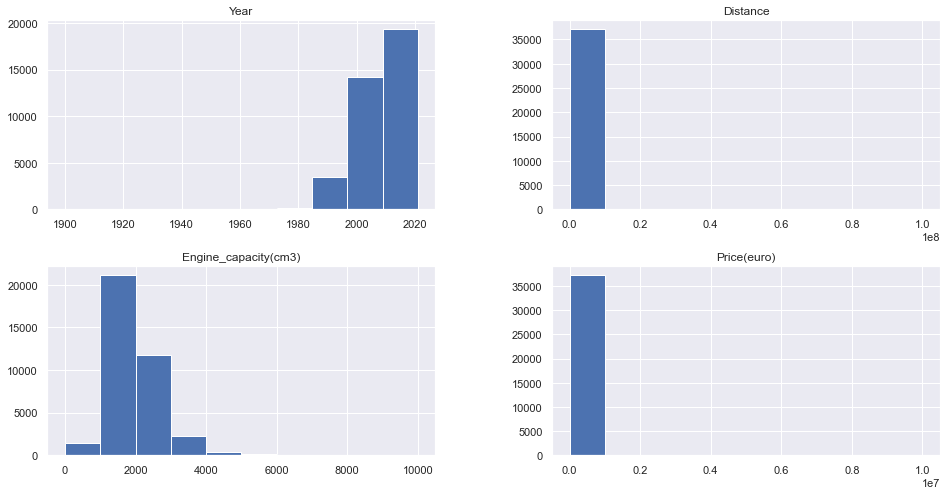

In [8]:
width = 2
fig, ax = plt.subplots(nrows=int(np.ceil(len(num_columns)/width)), ncols=width, figsize=(16,8))

for idx, column_name in enumerate(num_columns):
    col_idx = idx//width
    row_idx = idx%width
    df.hist(column = [column_name], ax=ax[col_idx,row_idx]);

Столбцы имеют явные аномалии, особенно Distance и Price(euro). Чтобы лучше понять эти аномалии посмотрим на столбцы в логарифмическом масштабе.

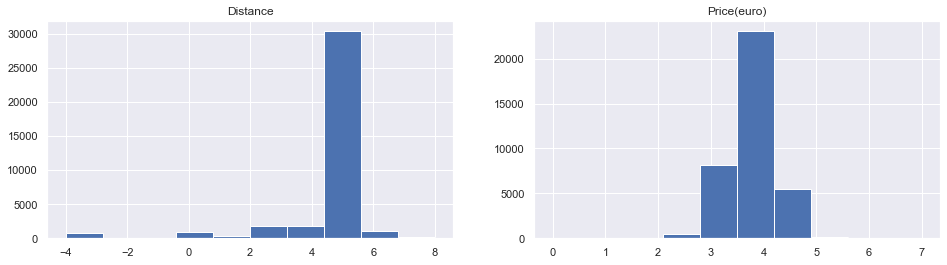

In [9]:
plt.figure(figsize=(16,4))
plt.subplot(121);plt.hist(np.log10(np.abs(df.Distance)+0.0001));plt.title('Distance')
plt.subplot(122);plt.hist(np.log10(np.abs(df['Price(euro)'])+0.0001));plt.title('Price(euro)')
plt.show()

Теперь мы можем определить, что нам требуется, чтобы почистить столбцы. Также, так как задача хорошо интерпретируема мы можем почистить столбцы пользуясь здравым смыслом. Например, мы можем удалить записи, где цена меньше 100 евро или пробег меньше 1000 км и год старый.

In [10]:
# due to reasonableness
question_dist = df[(df.Year <2021) & (df.Distance < 1100)]
df = df.drop(question_dist.index)

#histogram analysis
question_dist = df[(df.Distance > 1e6)]
df = df.drop(question_dist.index)

# due to reasonableness
question_engine = df[df["Engine_capacity(cm3)"] < 200]
df = df.drop(question_engine.index)

# due to reasonableness
question_engine = df[df["Engine_capacity(cm3)"] > 5000]
df = df.drop(question_engine.index)

# due to reasonableness
question_price = df[df["Price(euro)"] < 101]
df = df.drop(question_price.index)

# due to reasonableness
question_price = df[df["Price(euro)"] > 1e5]
df = df.drop(question_price.index)

#histogram analysis
question_year = df[df.Year < 1971]
df = df.drop(question_year.index)

df = df.reset_index(drop=True)
df.tail()

,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,Price(euro)
32601,Volkswagen,Passat,2016,Sedan,88000.0,1800.0,Petrol,Automatic,11500.0
32602,Land Rover,Freelander,2002,Crossover,225000.0,1800.0,Metan/Propan,Manual,4400.0
32603,Dacia,Logan Mcv,2015,Universal,89000.0,1500.0,Diesel,Manual,7000.0
32604,Mazda,6,2006,Combi,370000.0,2000.0,Diesel,Manual,4000.0
32605,Renault,Grand Scenic,2006,Minivan,300000.0,1500.0,Diesel,Manual,4000.0


Посмотрим на результат

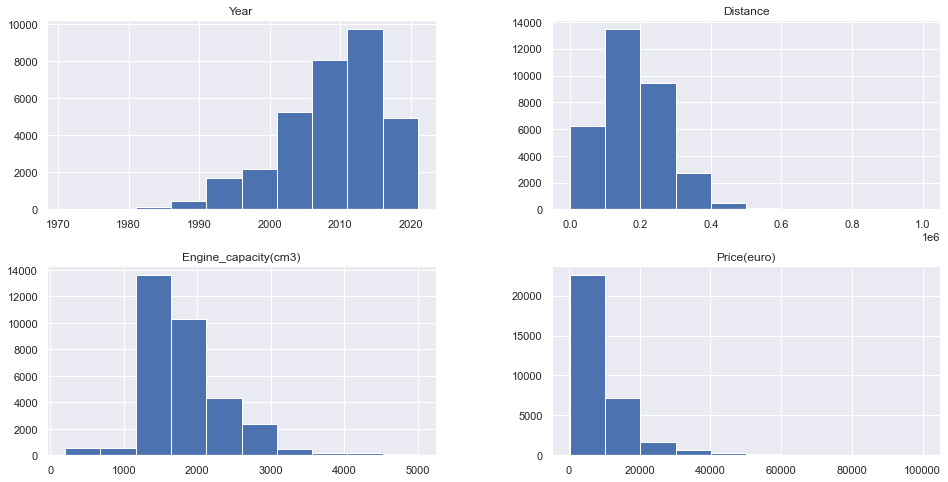

In [11]:
width = 2
fig, ax = plt.subplots(nrows=int(np.ceil(len(num_columns)/width)), ncols=width, figsize=(16,8))

for idx, column_name in enumerate(num_columns):
    col_idx = idx//width
    row_idx = idx%width
    
    df.hist(column = [column_name], ax=ax[col_idx,row_idx]);

### Вопрос:

<b>Начиная с кокого года мы теперь анализируем автомобили?<br>


### Вопрос:

<b>Назовите максимальную цену автомобиля?<br>


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32606 entries, 0 to 32605
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Make                  32606 non-null  object 
 1   Model                 32606 non-null  object 
 2   Year                  32606 non-null  int64  
 3   Style                 32606 non-null  object 
 4   Distance              32606 non-null  float64
 5   Engine_capacity(cm3)  32606 non-null  float64
 6   Fuel_type             32606 non-null  object 
 7   Transmission          32606 non-null  object 
 8   Price(euro)           32606 non-null  float64
dtypes: float64(3), int64(1), object(5)
memory usage: 2.2+ MB


Text(0.5, 1.0, 'Distance-Price')

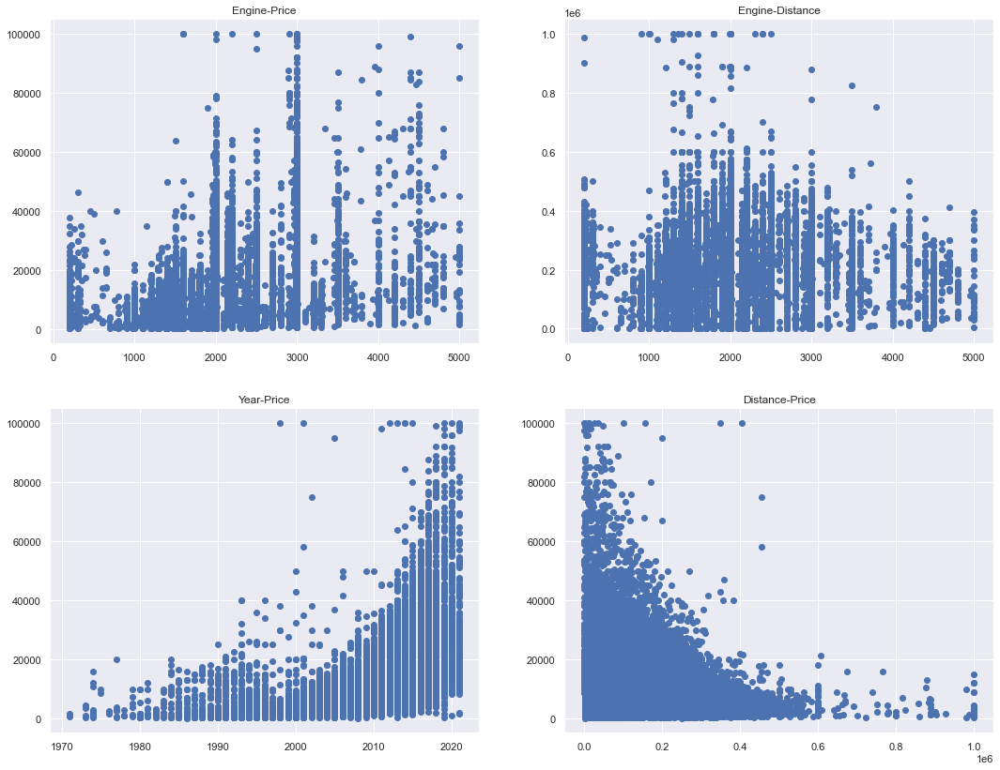

In [13]:
plt.figure(figsize=(18,14))
plt.subplot(221)
plt.scatter(df["Engine_capacity(cm3)"], df["Price(euro)"]); plt.title("Engine-Price")
plt.subplot(222)
plt.scatter(df["Engine_capacity(cm3)"], df["Distance"]);   plt.title("Engine-Distance") 
plt.subplot(223)
plt.scatter(df["Year"], df["Price(euro)"]);   plt.title("Year-Price") 
plt.subplot(224)
plt.scatter(df["Distance"], df["Price(euro)"]);   plt.title("Distance-Price")  
# plt.subplot(324)
# plt.scatter(df["Year"], df["Distance"]);   plt.title("Year-Distance") 
# plt.subplot(325)
# plt.scatter(df["Year"], df["Engine_capacity(cm3)"]);   plt.title("Year-Engine")  

### Добавление колонки
Зная суть или модель данных мы можем предположить, чего нам не хватает - то есть попробовать добавить новый признак в данные. Такую операцию можно провести по-разному. В данном случае мы сделаем это исходя из логики. Введем признак пробег в год. \
Отметим, что важно, чтобы новый признак был независим от других - иначе его потом придется удалить.


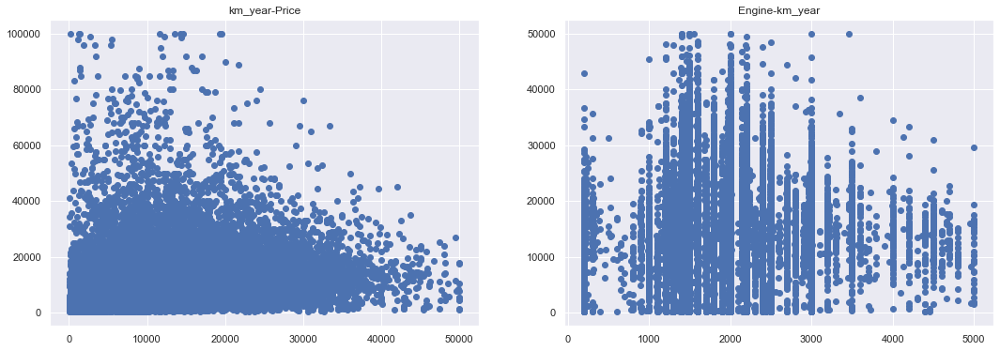

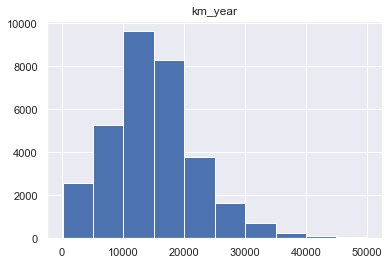

In [14]:
df['km_year'] = df.Distance / (2022 - df.Year)
question_km_year = df[df.km_year > 50e3]
df = df.drop(question_km_year.index)
question_km_year = df[df.km_year < 100]
df = df.drop(question_km_year.index)
df = df.reset_index(drop=True)

plt.figure(figsize=(18,6))
plt.subplot(121); plt.scatter(df["km_year"], df["Price(euro)"]); plt.title("km_year-Price")
plt.subplot(122); plt.scatter(df["Engine_capacity(cm3)"], df["km_year"]); plt.title("Engine-km_year")
plt.show();

df.hist(column = ["km_year"]);

### Вопрос:

<b>Назовите величину максимального пробега в год с точностью до целых числен<br>


### Удаление аномалий и связанных признаков.
Часто проведенного выше анализа данных бывает недостаточно. Помимо всего выше изложенного бывает необходимо удаление аномалий из данных.

Посмотрим на аномалии с использованием т.н. boxplot - метода. Метод фактически визуализирует распределение для каждой категории, где основной прямоугольник - это основной диапазон значений, его центр (Обозначен линией) это центральная мода - то есть максимум, основные усы - это ожидаемый разброс, а все что за ними - это аномалии.

![](https://static.tildacdn.com/tild6533-3362-4632-b632-333165363837/image.png) 

<AxesSubplot:>

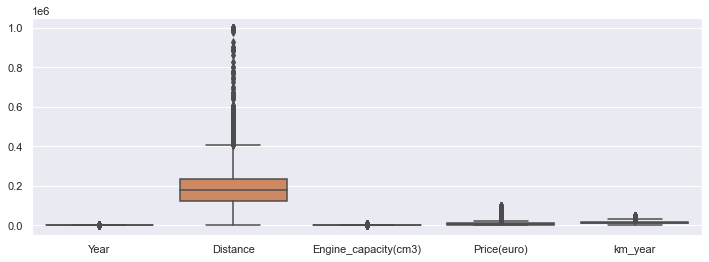

In [15]:
fig = plt.figure(figsize=(12,4))
sns.boxplot(data =df)

### Вопрос:

<b>Какой столбец заслуживает фильтрации на аномалии больше всего <br>


<AxesSubplot:>

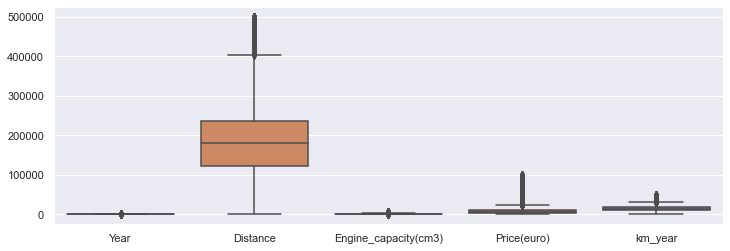

In [16]:
question_dist = df[(df.Distance > 0.5e6)]
df = df.drop(question_dist.index)

df = df.reset_index(drop=True)

fig = plt.figure(figsize=(12,4))
sns.boxplot(data =df)

Посмотрим на корреляцию численных столбцов. Корреляция - это степень линейной зависимости между двумя наборами данных. Например, если два вектора коллиниарны, то их корреляция = 1, если анти коллиниарны, то -1. Если два вектора ортогональны, то корреляция = 0. Для СЛАУ коррелированность значит вырожденность, то есть если есть СЛАУ с двумя выжражениями коррелирующими (+-1) друг с другом, то СЛАУ вырождена. Чем меньше корреляция - тем менее вырождена (лучше обусловлена) СЛАУ. Если в слау выражений больше чем искомых переменных, то есть, есть запас - то несколько коллиниарностей не приведут к вырожденности, но скажутся на времени вычислений, и вряд ли повысят точность. То есть мы хотим найти, если есть, коллиниарные колонки в наборе и их удалить.

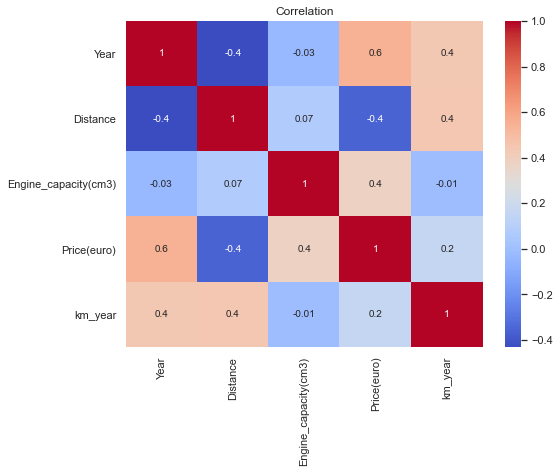

In [17]:
fig, ax = plt.subplots(figsize=(8,6))
plt.title('Correlation')
sns.heatmap(df.corr(), annot=True, fmt='.1g', cmap="coolwarm");

### Вопрос:

<b>Назовите параметр наименее коррелирующий с целевым показателем<br>


### Вопрос:

<b>Назовите пару показателей с наибольшей корреляцией<br>


### Вопрос:

<b>Назовите корреляцию между <code> km_year  и year и distance<br>


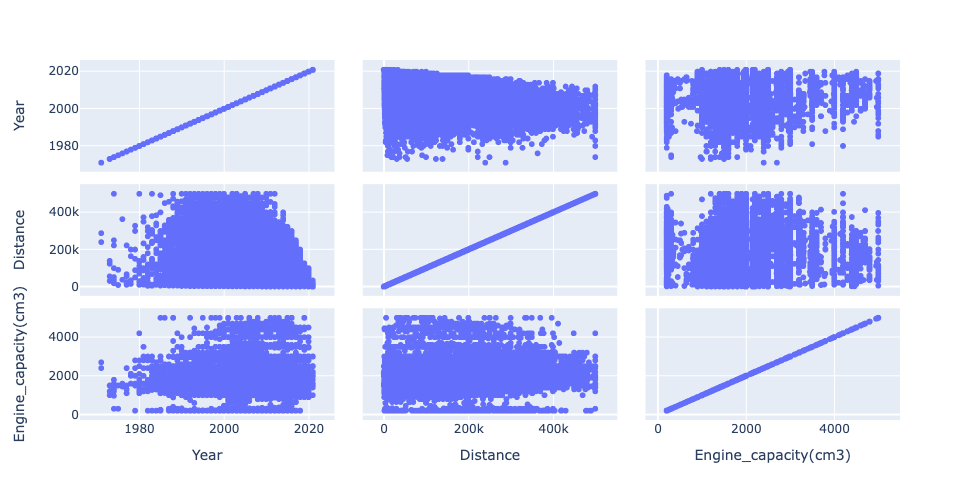

In [18]:
fig = px.scatter_matrix(df[num_columns[:-1]], 
                        width=500, 
                        height=500)
fig.show()

### Категориальные данные
посмотрим на число повторений результата в каждом категориальном признаке. Очевидно, следует ожидать, что для категориального признака самым важным становится число повторений каждого значения. Если такое число мало - скорее всего данное значение не информативно. 

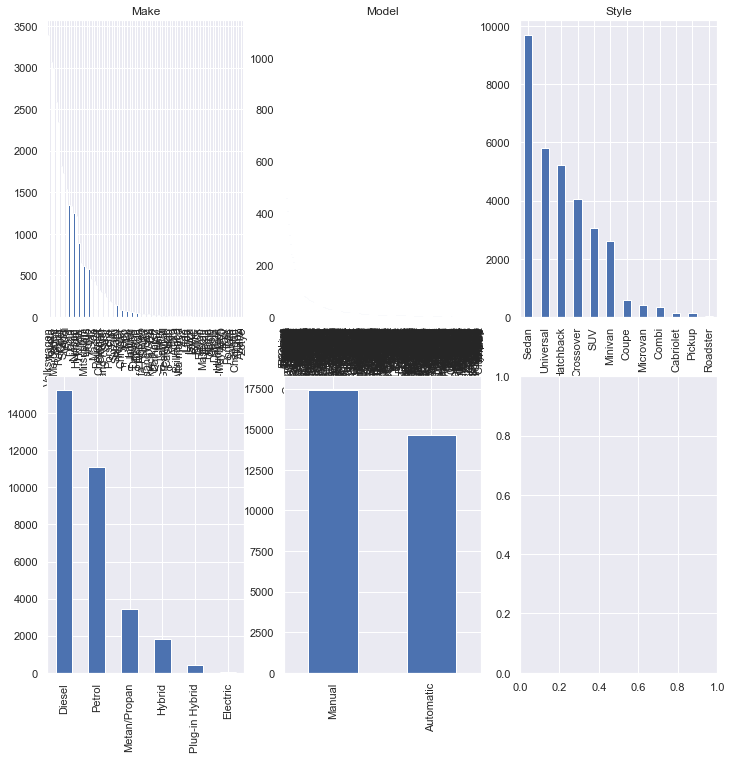

In [19]:
fig, ax = plt.subplots(nrows=int(np.ceil(len(cat_columns)/3)), ncols=3, figsize=(12,12))

for idx, column_name in enumerate(cat_columns):
    col_idx = idx//3
    row_idx = int(idx%3)
    df[column_name].value_counts().plot(ax = ax[col_idx,row_idx], kind='bar',title=column_name)


### Вопрос: 

<b>Назовите бирнарный признак (то есть тот, по которму можно сделать замену вида "да-нет"
   

### Вопрос: 

<b>Назовите какие столбцы следует фильтровать больше всего (два)
    

Давайте также проверим как распределены данные в зависимости от типа трансмиссии 

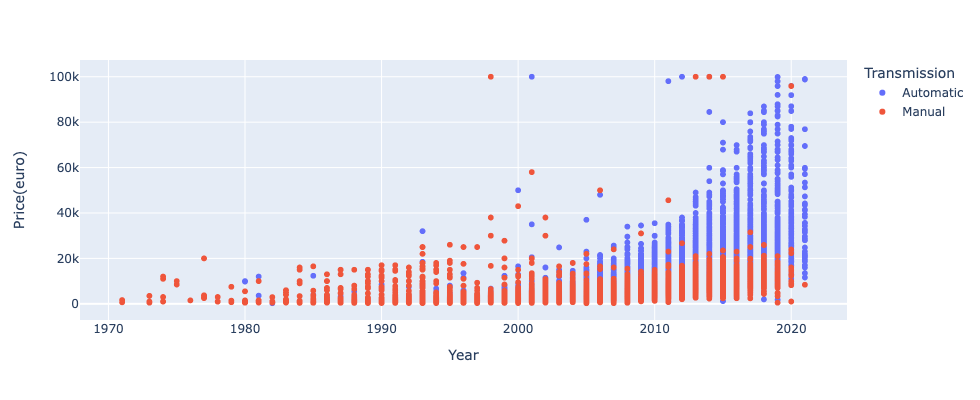

In [20]:
px.scatter(df.sample(20000),
          x = "Year",
          y = "Price(euro)",
          color = "Transmission",
          width=600, height=400)

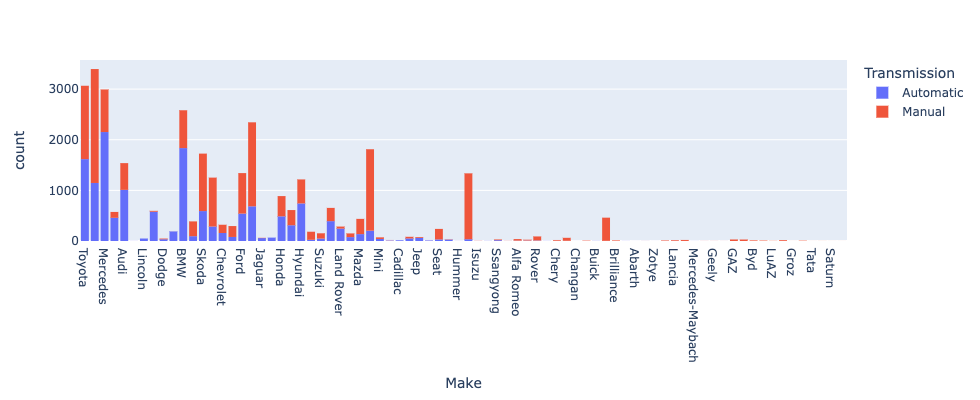

In [21]:
px.histogram(df,x='Make', color='Transmission', width=600, height=400)

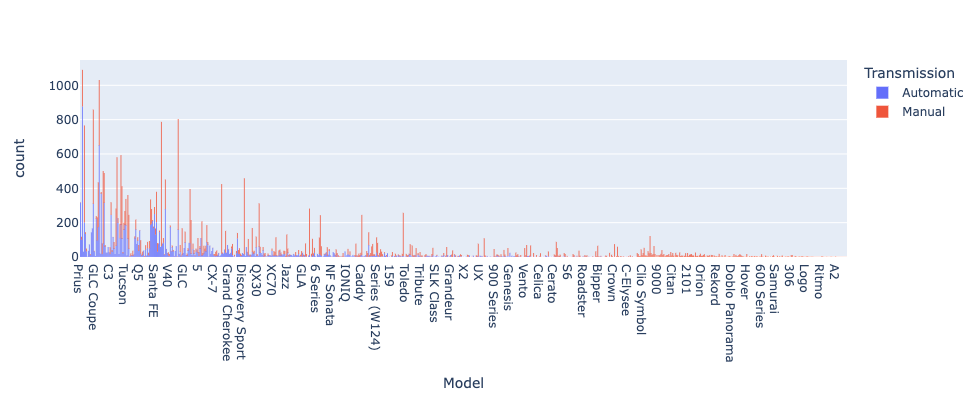

In [22]:
px.histogram(df,x='Model', color='Transmission', width=600, height=400)

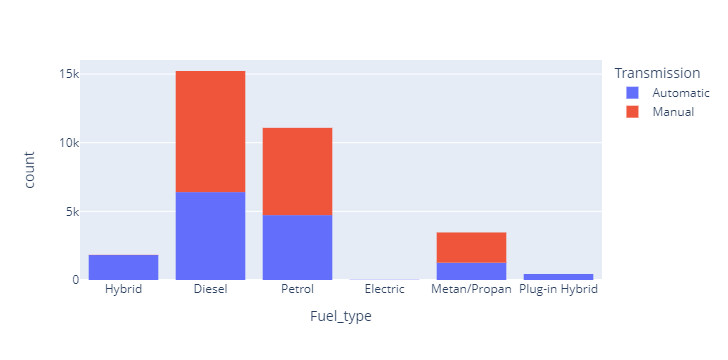

In [23]:
px.histogram(df, x='Fuel_type',color='Transmission' ,width=600, height=300 )

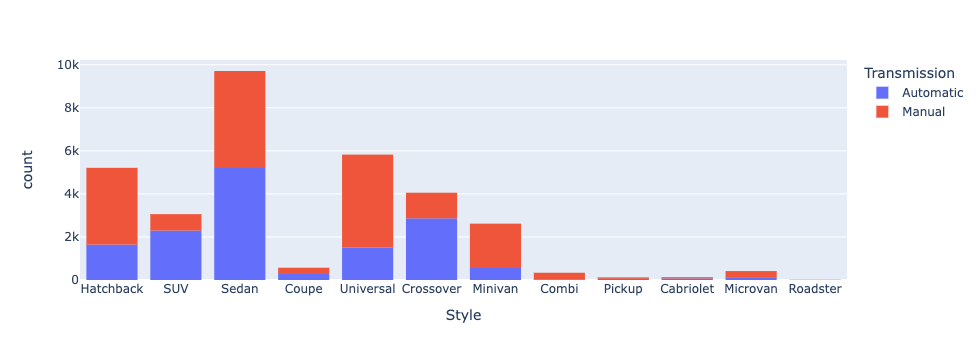

In [24]:
px.histogram(df, x='Style',color='Transmission' ,width=600, height=300 )

Оказалось, что часть из наших признаков имеют слишком много записей.<br>
Вероятно, редкие значения можно исключить без потери точности.<br>
Мы сделаем эту операцию объявив такие записи одним типом - rare.<br>
Такая операция характерна именно для категориальных данных  - новый тип будет информативен, так как его представителей будет много. Однако, если бы тип rare стал слишьком превалировать над остальными, то следовало бы подумать о других заменах.

In [25]:
counts = df.Make.value_counts()
counts

Volkswagen    3396
Toyota        3066
Mercedes      2993
BMW           2582
Renault       2344
              ... 
Saturn           1
Changan          1
Groz             1
Abarth           1
Zotye            1
Name: Make, Length: 78, dtype: int64

In [26]:
rare =  counts[(counts.values < 10)]
df['Make'] = df['Make'].replace(rare.index.values, 'Rare')
df.Make.value_counts()

Volkswagen        3396
Toyota            3066
Mercedes          2993
BMW               2582
Renault           2344
Opel              1812
Skoda             1726
Audi              1538
Ford              1341
Dacia             1336
Nissan            1252
Hyundai           1216
Honda              887
KIA                654
Mitsubishi         611
Lexus              595
Volvo              574
Vaz                461
Mazda              437
Peugeot            387
Chevrolet          321
Citroen            295
Land Rover         285
Seat               239
Porsche            190
Fiat               183
Suzuki             152
Subaru             150
Rover               90
Chrysler            83
Jeep                77
Mini                72
Rare                70
Infiniti            67
Jaguar              64
Daewoo              63
Lincoln             49
Dodge               49
Alfa Romeo          38
Smart               33
Ssangyong           32
GAZ                 30
Moskvich / Izh      29
Daihatsu   

In [27]:
counts = df.Model.value_counts()
rare =  counts[(counts.values < 50)]
df['Model'] = df['Model'].replace(rare.index.values, 'Rare')
df.Model.value_counts()

Rare             6680
E Class          1090
5 Series         1030
Passat            858
Megane            803
                 ... 
Urban Cruiser      51
Accent             51
Vento              51
Matrix             50
Avensis Verso      50
Name: Model, Length: 134, dtype: int64

#### Вопрос: 

<b>Назовите самую распростроненную марку (кроме Rare)
    

### Вопрос: 

<b>Назовите самую распростроненную модель (кроме Rare)
   

## Приведение категориальных признаков к численным

### Бинарные признаки

In [28]:
df['Transmission'] = df['Transmission'].map({'Automatic': 1, 'Manual': 0})

### Пространственное кодирование многозначных признаков
Пространственным (sparce) - называется кодирование, когда мы назначем какую либо цифру каждому признаку, например, 1 - lada, 2 - skoda, 3 - honda и т.д. Такое кодирование очевидно и пригодно для некоторых алгоритмов машинного обучения (почти для всех популярных алгоритмов). Однако, в ряде случаев такое кодирование нельзя использовать, например, если код будет означеть какой-либо приоретет, например honda над lada. Такая ситуация (приоретет) характерна для линейных алгоритмов, например линейной или логистической регрессии. Для них мы предусмотрим другое кодирование.

In [29]:
df_se = df.copy()
df_se[cat_columns] = df_se[cat_columns].astype('category')

for _, column_name in enumerate(cat_columns):
    df_se[column_name] =  df_se[column_name].cat.codes
df_se.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32074 entries, 0 to 32073
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Make                  32074 non-null  int8   
 1   Model                 32074 non-null  int16  
 2   Year                  32074 non-null  int64  
 3   Style                 32074 non-null  int8   
 4   Distance              32074 non-null  float64
 5   Engine_capacity(cm3)  32074 non-null  float64
 6   Fuel_type             32074 non-null  int8   
 7   Transmission          32074 non-null  int8   
 8   Price(euro)           32074 non-null  float64
 9   km_year               32074 non-null  float64
dtypes: float64(4), int16(1), int64(1), int8(4)
memory usage: 1.4 MB


Посмотрим какой теперь стала наша матрица взаимных корреляций

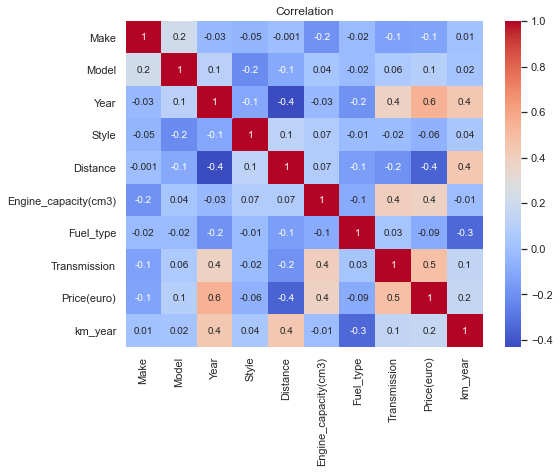

In [30]:
fig, ax = plt.subplots(figsize=(8,6))
plt.title('Correlation')
sns.heatmap(df_se.corr(), annot=True, fmt='.1g', cmap="coolwarm");

### Вопрос: 
<b>Назовите столбец наименее коррелриующий с Transmission? 
   

### Вопрос: 
<b>Назовите столбец более всего зависящий от Transmission? 
    

### One-hot кодирование многозначных признаков
Данный тип кодирование - это альтернатива простарнственному кодированию. Тип подходит для линейных алгоритмов. Также данный тип может быть использован в более сложных подходах к анализу данных, выходящих за рамки курса (например, мягкие метки).

Принцип данного кодирования заключается в том, что мы заменяем один категориальный столбец на несколько таких, что каждый будет соответствовать одной категории, а его значения будут или 0 или 1 - если для записи (строчки) имеет место такая категория.

![](https://russianblogs.com/images/855/ddd65f4f342886bb411d41a33c5528e7.png)


In [31]:
df_ohe = df.copy()
df_ohe = pd.get_dummies(df_ohe)
df_ohe.tail()

,Year,Distance,Engine_capacity(cm3),Transmission,Price(euro),km_year,Make_Acura,Make_Alfa Romeo,Make_Alta marca,Make_Audi,...,Style_Roadster,Style_SUV,Style_Sedan,Style_Universal,Fuel_type_Diesel,Fuel_type_Electric,Fuel_type_Hybrid,Fuel_type_Metan/Propan,Fuel_type_Petrol,Fuel_type_Plug-in Hybrid
32069,2016,88000.0,1800.0,1,11500.0,14666.666667,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
32070,2002,225000.0,1800.0,0,4400.0,11250.000000,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
32071,2015,89000.0,1500.0,0,7000.0,12714.285714,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
32072,2006,370000.0,2000.0,0,4000.0,23125.000000,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
32073,2006,300000.0,1500.0,0,4000.0,18750.000000,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [32]:
df_ohe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32074 entries, 0 to 32073
Columns: 214 entries, Year to Fuel_type_Plug-in Hybrid
dtypes: float64(4), int64(2), uint8(208)
memory usage: 7.8 MB


### Вопрос: 
<b>Сколько столбцов получилось ? 
    

In [33]:
df_ohe.describe()

,Year,Distance,Engine_capacity(cm3),Transmission,Price(euro),km_year,Make_Acura,Make_Alfa Romeo,Make_Alta marca,Make_Audi,...,Style_Roadster,Style_SUV,Style_Sedan,Style_Universal,Fuel_type_Diesel,Fuel_type_Electric,Fuel_type_Hybrid,Fuel_type_Metan/Propan,Fuel_type_Petrol,Fuel_type_Plug-in Hybrid
count,32074.000000,32074.000000,32074.000000,32074.000000,32074.000000,32074.000000,32074.000000,32074.000000,32074.000000,32074.000000,...,32074.000000,32074.000000,32074.000000,32074.000000,32074.000000,32074.000000,32074.000000,32074.000000,32074.000000,32074.000000
mean,2008.336004,180297.720646,1868.531770,0.457660,9479.187722,14882.489475,0.000436,0.001185,0.000405,0.047952,...,0.000686,0.095373,0.302706,0.181611,0.474652,0.000904,0.057243,0.107969,0.345576,0.013656
std,7.162778,90541.530459,609.824918,0.498212,9531.545838,7251.805242,0.020888,0.034400,0.020129,0.213667,...,0.026181,0.293734,0.459436,0.385530,0.499365,0.030056,0.232309,0.310346,0.475563,0.116060
min,1971.000000,100.000000,200.000000,0.000000,200.000000,100.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2005.000000,123000.000000,1500.000000,0.000000,3600.000000,10250.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2010.000000,180000.000000,1800.000000,0.000000,6799.000000,14432.509804,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2014.000000,235359.250000,2000.000000,1.000000,12075.250000,18800.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000
max,2021.000000,500000.000000,5000.000000,1.000000,100000.000000,50000.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#### Вопрос: 
<b>Назовите средний год по выборке? 
    

Сохраним полученные данные в нескольких видах, которые понадобяться нам позже. 

In [44]:
df_num = df[num_columns].copy()
df_num.to_csv('car_num.csv')
df_cat = df[cat_columns].copy()
df_cat.to_csv('car_cat.csv')

df_se.to_csv('car_se.csv')


проверим, что все открылось как следует


In [47]:
df_se = pd.read_csv("car_se.csv")
df_se

,Unnamed: 0,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,Price(euro),km_year
0,0,50,92,2011,4,195000.0,1800.0,2,1,7750.0,17727.272727
1,1,41,62,2014,11,135000.0,1500.0,0,0,8550.0,16875.000000
2,2,41,71,2012,11,110000.0,1500.0,0,0,6550.0,11000.000000
3,3,37,23,2006,11,200000.0,1600.0,3,0,4100.0,12500.000000
4,4,32,124,2000,5,300000.0,2200.0,0,0,3490.0,13636.363636
...,...,...,...,...,...,...,...,...,...,...,...
32069,32069,53,88,2016,10,88000.0,1800.0,4,1,11500.0,14666.666667
32070,32070,27,53,2002,3,225000.0,1800.0,3,0,4400.0,11250.000000
32071,32071,12,77,2015,11,89000.0,1500.0,0,0,7000.0,12714.285714
32072,32072,31,10,2006,1,370000.0,2000.0,0,0,4000.0,23125.000000


# Алгоритмы своими руками

## Линейная регрессия своими руками

проведем линейную регрессию только по численным столбцам. Их у нас будет 3. <br>
ВВедем модель целевой переменной как
$$ \begin{align*}
   &y_i = \sum_{j=0}^{2}x_{ij}w_j +\eta_i \\ 
   \text{или так }& y_i = x_{i0}\cdot w_0 + x_{i1}\cdot w_1 + x_{i2}\cdot w_2 + \eta_i \\
   \text{или так }& y_i = X_i W^T + \eta_i , 
   \end{align*}
   $$
где <ul>
    <li> $y_i$ - целевой показаль предсказания для $i$ записи в наборе данных;
    <li> $X_i  = (x_{i0},x_{i1},x_{i2}) = \{x_{ij}\}_{j=0}^{2}$ - набор входных параметров для $i$ результата ($X_i^T$ - траспонированная строка (столбец));
    <li> $W = (w_0,w_1,w_2) = \{w_{j}\}_{j=0}^{2}$ - набор весовых параметров, которые мы должны подобрать в моделе;
    <li> $\eta_i$ - некоторый набор случайных (не объясняемых нашей моделью, остаточных) значений, мы будем считать их случайных шумом.  </ul>   
    <br> тогда наша регрессионная модель будет иметь вид
        $$ \begin{align*}
   &\hat{y}_i = \sum_{j=0}^{2}x_{ij}w_j  \\ 
   \text{или так }& \hat{y}_i = x_{i0}\cdot w_0 + x_{i1}\cdot w_1 + x_{i2}\cdot w_2  \\
   \text{или так }& \hat{y}_i = X_i W^T, 
   \end{align*}
   $$
где <ul> 
    <li> $\hat{y}_i $ - результат предсказания для $i$ записи в наборе данных.   </ul>   
        
Для начала разобъем данные на тест и тренировочные

In [46]:
df_num = df[num_columns].copy()

df_num.info()

X,y = df_num.drop(columns = ['Price(euro)']).values,df_num['Price(euro)'].values


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

scaler  = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test) 

pd.DataFrame(X_train).tail()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32074 entries, 0 to 32073
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Year                  32074 non-null  int64  
 1   Distance              32074 non-null  float64
 2   Engine_capacity(cm3)  32074 non-null  float64
 3   Price(euro)           32074 non-null  float64
dtypes: float64(3), int64(1)
memory usage: 1002.4 KB


,0,1,2
22446,0.64,0.479896,0.353333
22447,0.74,0.465893,0.479167
22448,0.70,0.572360,0.333333
22449,0.70,0.581916,0.375000
22450,0.24,0.579916,0.000000


Введем функцию потрерь регрессии как квадрат разности между целевыми значениями и их предсказаниями 
$$ L(\hat{y}_i,y_i)=L_i= (\hat{y}_i-y_i)^2 = \left(\sum_{j=0}^{2}x_{ij}w_j-y_i\right)^2 = \left(X_i W^T-y_i\right)^2 , $$
где  $L_i$ - функция потерь для результата (предсказания) с номером $i$. <br>
Также введем функцию расчета (предсказания) значений predict.


In [47]:
def forward(weights, inputs):
    return inputs.dot(weights.T)

def loss_func(predicts, labels):
        return np.square(predicts - labels)  

Протестируем обе функции

In [48]:
weights = np.random.randn(X.shape[1])
print(weights)
yhat = forward(weights, X_train[0])
loss = np.sqrt(loss_func(yhat, y[0]))
print(yhat, y[0], loss)

[ 0.82242329 -2.14896231 -0.98789087]
-1.371654380025219 7750.0 7751.371654380026


Посмотрим на график того как меняется функция потерь в зависимости от отклонения (мультипликативного) оценки результата от его истинного значения.

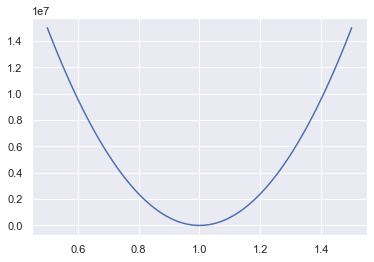

In [49]:
decline = np.linspace(start = 0.5, stop = 1.5,num = 100)
yhat = decline* y[0]
loss = loss_func(yhat, y[0])
plt.plot(decline,loss)

### Вопрос
1. назовите результат функции потерь если истинное значение 2, а оценка результата 4.<br>


Сразу омтетим, что нам потребуется не только сама фунция потерь, но и ее производная по набору оптимизируемых параметров $\{w_j\}$.   
    $$ \frac{\partial L_i}{\partial w_j} = 2\left(\sum_{j=0}^{2}x_{ij}w_j-y_i\right)x_{ij} = 2(\hat{y}_i - y_i)x_{ij}, $$
где  $\frac{\partial L_i}{\partial w_j}$ - частная производная функции $L_i$ по параметру $w_j$  <br>   
тогда по набору всех переменных мы получим производную вида:
$$\nabla_{W}L_i = 2\left ((\hat{y}_i-y_i)x_{i0}, 
(\hat{y}_i-y_i)x_{i1}, 
(\hat{y}_i-y_i)x_{i2} \right) = 2(\hat{y}_i-y_i)\odot X_i^T,  $$
 где <ul> 
    <li> $\nabla_{W}L_i$ - градиент, то есть набор частных производных функции $L_i$ по набору \{$w_j$\}.  
    <li> $\odot$ - операция поэлементного умножения (умножение Адамара)    

In [50]:
def grad_loss(predicts, labels, inputs):
    return 2*(predicts - labels)*inputs/inputs.size

Проведем расчет градиента ошибки

In [51]:
weights = np.random.randn(X.shape[1])
yhat = forward(weights, X_train[0])

grad = grad_loss(yhat, y[0], X[0])
print(grad)

[-1.03910832e+07 -1.00758887e+09 -9.30082035e+06]


### Вопрос
1. назовите результат градиента функции потерь если истинное и оцененное значения совпадают.<br>


### Вопрос
1. назовите результат градиента функции потерь если результат оценки 4, истинное значение 2, а входные данные (1,2,3).<br>


Опимизацию мы будем проводить методом граидентного спуска. <br>
По сути этот метод сводится к последовательному (итерационному) пересчету значений весовых параметров обратно значеням градиента ошибки (то есть в направлении, обратном направлению роста ошибки).
<br> обозначим номер итерации как  $t$, тогда выражение для обновления весовых параметров можно записать как: 

$$ W^t = W^{t-1}-\eta\nabla_{W}L(\hat{y}_i,y_i)=W^{t-1} - 2\eta (\hat{y}_i-y_i)\odot X_i^T  $$

где <ul>
<li> $\eta$ - коэффициент с которым изменяются значения весовых параметров - т.н. скорость обучения;



In [52]:
def update_weights(grad, weights, lerning_rate):
    return weights - lerning_rate*grad

теперь проведем обновление весовых параметров

In [53]:
lerning_rate = 0.01
weights = update_weights(grad, weights, lerning_rate)
print(weights)

[  103912.77730411 10075886.57312529    93006.85027746]


### Вопрос
1. назовите обновление весовых параметров если результа и иситнное значение сопадают, а скорость обучения 0.02.<br>


Помимо того, чтобы обучать значения весовых параметров,  необходимо задать их начальные значения - то есть провести процедуру инициализации. Такую процедуру можно провести с использованием небольших случайных  значений. Разброс этих значений мы виберем как $\sqrt{weight.size}$

In [54]:
def weights_init(weights, random_state=42):
    if np.ndim(weights)<1:
        weights = np.zeros(weights)
        
    np.random.seed(random_state)
    return np.random.randn(*weights.shape)/np.sqrt(weights.size)

Также создадим процедуру обучения. Процедура будет повторять порцесс пересчета весов методом градиентного спуска заданое число раз (epochs).<br> 
Функция будет требовать на вход <ul>
    <li> $X$ - набор входных значений (т.н. батч ) в формате: $\textrm{число записей}\times\textrm{значения в записи}$;
    <li> $y$ - набор целевых переменных (labels);   
    <li> $weights$ - начальные значения весовых параметров;
    <li> $lr$ - скорость обучения;    
    <li> $epochs$   -  число эпох обучения.
        </ul>
Функция дает на выходе:<ul>
    <li> $weights$ - набор обученных весовых параметров;
    <li> $cost$    - график функции потерь.
 </ul>
Также отметим, что на практике мы можем обновлять весовые параметры не для кажого отдельного значения $i$, а для целого набора такхи значений, тогда более верное выражение будет выглядеть как

$$ W^t = W^{t-1}-\eta\frac{1}{M}\sum_{m=1}^{M-1}\nabla_{W}L(\hat{y}_i,y_i),  $$
где $M$ - объем выборки.        

In [55]:
def fit(X, y, weights, lr,  epochs=30):
    
    cost = np.zeros(epochs)
    for i in range(epochs): 
        
        grad = np.zeros(weights.shape);
        loss = 0;
        
        for m in range(X.shape[0]): 
            yhat  = forward(weights, X[m,:])
            grad += grad_loss(yhat,  y[m], X[m,:])
            loss += loss_func(yhat,  y[m])

        weights = update_weights(grad/X.shape[0],weights, lr)  
        cost[i] = loss/X.shape[0]
    
    return weights, cost

Протестируем обучение

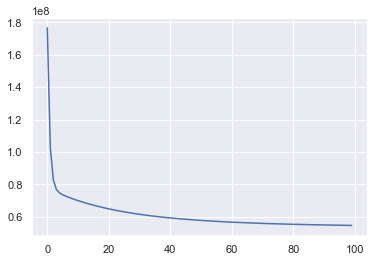

In [56]:
weights = weights_init(X_train.shape[1], random_state=42)

weights, cost = fit(X_train, y_train, weights, lr=0.9,  epochs=100)

plt.plot(cost)

Теперь проверим как точно предсказывает наша функция, для этого мы можем воспользоваться метрикой r2, метрика соотвествует относительной среднеквадратичной ошибке, она может быть расчитана как:
$$ 
R^2 = 1-\frac{\sum_{i=0}^{M-1}(y_i - \hat{y}_i)^2}{\sum_{i=0}^{M-1}(y_i - \mathrm{ev}(y))^2} = 1 - \frac{SS_{\rm res}}{SS_{\rm tot}},
$$
где <ul>
    <li> $SS_{\rm res} = \sum_{i=0}^{M-1}L_i = \sum_{i=0}^{M-1}(y_i - \hat{y}_i)^2 $ - суммма квадратов остатков, величина, характеризующая степень того на сколько наша модель не соотвествует нашим данным - то есть то, на сколько мы не можем объяснить нашей моделью наши данные;
    <li> $SS_{\rm tot}$ - дисперсия данных - то есть сумма квадратов разностей значений данных и их среднего значения;
    <li> $\mathrm{ev}(y) = \frac{1}{M}\sum_{i=0}^{M-1}y_i$ - среднее значение.    

In [57]:
def predict(weights, inputs):
    yhat = np.zeros(inputs.shape[0])
    
    for m in range(inputs.shape[0]):
        yhat[m] = inputs[m,:].dot(weights.T)
    
    return yhat

посмотрим как выглядят наши ответы на фоне реальных

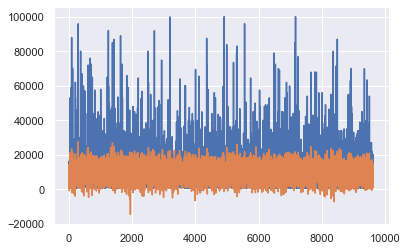

In [58]:
yhat = predict(weights, X_test)
plt.plot(y_test, label='original')
plt.plot(yhat, label='predicted')

In [59]:
def r2_score(weights, inputs, labels):
    predicts = predict(weights, inputs)
    return 1-np.sum(np.square(labels-predicts))/np.sum(np.square(labels-np.mean(labels)))

In [60]:
labels = np.array([1,2,3])
predicts = np.array([2,4,6])
1-np.sum(np.square(labels-predicts))/np.sum(np.square(labels-np.mean(labels)))

-6.0

In [61]:
r2_score(weights, X_test, y_test)

0.37921301248245987

###  вопрос
1. назовите значение ошбики r2 если истинные значения 1,2,3 а оцененные 2,4,6.<br>


На практике как правило, на каждой эпохе рассматривается не веся выборка, а только некоторая ее часть - т.н. батч (мини пакет). 

In [62]:
BATCH = 5000

def fit_SGD(X, y, weights, lr,  epochs=30, batch_size = BATCH, random_state = 42):
    
    np.random.seed(random_state)
    
    
    cost = np.zeros(epochs)
    for i in range(epochs): 
        
        grad = np.zeros(weights.shape);
        loss = 0;
        
        idx_batch = np.random.randint(0,X.shape[0],batch_size)
        x_batch   = np.take(X, idx_batch, axis=0)
        y_batch   = np.take(y, idx_batch)

        
        for m in range(batch_size): 
            yhat  = forward(weights, x_batch[m,:])
            grad += grad_loss(yhat,  y_batch[m], x_batch[m,:])
            loss += loss_func(yhat,  y_batch[m])

        weights  = update_weights(grad/batch_size,weights, lr)  
        cost[i] =loss/batch_size
    
    return weights, cost

0.39981284011738194


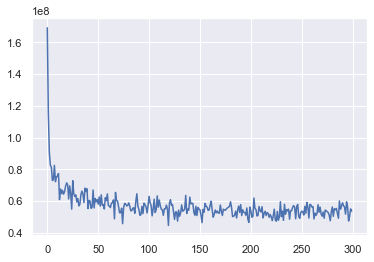

In [63]:
weights = weights_init(X_train.shape[1], random_state=42)

weights, cost = fit_SGD(X_train, y_train, weights, lr=0.7,  epochs=300)

plt.plot(cost)

print(r2_score(weights, X_test, y_test))

Теперь давайте объеденим все наши часть в один класс линейной регресии.
<br> При объединении мы сделаем две дополнительные модификации нашей модели.
<ul>
    <li> во-первых, введем в модель дополнительный член - смещение ($b$), тогда можно записать модель так:
        $$\begin{align*}
        &\hat{y}_i = \sum_{j=0}^{M-1}x_{ij}w_j+b \\
        \text{   или так: }&\hat{y}_i = \sum_{j=0}^{M}x_{ij}w_j, x_{i0} \equiv 1.
        \end{align*}$$
        обе запси формально равнозначны. <ul>
        при этом отметим, что градиент функции потерь по остаточному члену можно записать следующим образом:
        $$b^t = b^{t-1}-\eta\nabla_{b}L(\hat{y}_i,y_i)=b^{t-1} - 2\eta(\hat{y}_i-y)$$
        </ul>
        Мы будем использовать второй вариант, то есть объеденим веса и смещния, а к данным добавим столбец едениц.
<li> Во воторых запишем все обозначенные функции в один класс.
<li> В третьих проведем векторизацию в тех местах, где у нас стояли лишнии циклы.
    <br> В том числе отметим, что выражение для расчет суммарного градиента может быть записано векторно в следующей форме
    $$2\sum_{i=0}^{M-1}(\hat{y}_i-y_i)\odot X_i^T = 2 X_i^T(\hat{y}-y), $$ 
    где $\hat{y}, y$ - массивы значений оценок и целевых результатов.
    

In [64]:
class LinearRegression():
    def __init__(self, 
                 learning_rate = 0.5, 
                 epochs = 100, 
                 weights = None, 
                 bias    = None, 
                 batch_size   = 1000, 
                 random_state = 42):
        self.lr      = learning_rate
        self.epochs  = epochs
        self.weights = weights
        self.bias    = bias
        self.seed    = random_state
        self.batch_size = batch_size
        self.cost    = np.zeros(epochs)
        
        # if both predefined
        if not(self.weights is None) and (self.bias):
            if self.weights.size == X.shape[1]:
            #merge both together if it was not done! 
                self.weights = np.append(self.bias,self.weights)
    
    #---------------------------------
    def forward(self, X):
        return self.weights.dot(X.T)
    
    #---------------------------------
    def loss(self,yhat, y):
        return np.square(yhat - y).sum()/y.size
    
    #---------------------------------
    def grad_step(self,yhat, y, X):
        return 2*np.dot(X.T, (yhat - y)) / y.size
    
    #---------------------------------
    def update(self):    
        return self.weights - self.lr*self.grad
    
    #---------------------------------
    def init(self, weights_size):
        np.random.seed(self.seed)
        return np.random.randn(weights_size)/np.sqrt(weights_size)
    
    #---------------------------------
    def predict(self, X):
        yhat = self.forward(self.add_bias(X))
        return yhat
    
    #---------------------------------
    def score(self, X, y):        
        yhat = self.predict(X)
        return 1-np.sum(np.square(y-yhat))/np.sum(np.square(y-np.mean(y)))
    
    #---------------------------------
    def fit(self, X, y):

        np.random.seed(self.seed)
        
        if self.weights is None:
            self.weights = self.init(X.shape[1])
        
        if self.bias is None: 
            self.bias    = self.init(1)
        
        if self.weights.size == X.shape[1]:
            #merge both together if it was not done! 
            self.weights = np.append(self.bias,self.weights)
        
        self.grad    = np.zeros(self.weights.shape)
        self.cost    = np.zeros(self.epochs)

        if self.batch_size is None:            
            x_batch   = self.add_bias(X)
            y_batch   = y
        
        for i in range(self.epochs): 

            if self.batch_size: #take batch
                x_batch, y_batch = self.load_batch(X,y)

            yhat         = self.forward(x_batch)
            self.grad    = self.grad_step(yhat,  y_batch, x_batch) 
            self.weights = self.update() #backward 
            self.cost[i] = self.loss(yhat,  y_batch)
        
        # only for output
        self.bias = self.weights[0]
     #---------------------------------
    def load_batch(self,X,y):
        idx_batch = np.random.randint(0,X.shape[0],self.batch_size)
        x_batch   = np.take(X, idx_batch, axis=0)
        x_batch   = self.add_bias(x_batch)
        y_batch   = np.take(y, idx_batch)
        return  x_batch, y_batch
    
    #---------------------------------
    def add_bias(self, X):
        return np.column_stack((np.ones(X.shape[0]), X))
    
    #---------------------------------
    def plot_cost(self, figsize = (12,6)):
        plt.figure(figsize = figsize)
        plt.plot(self.cost)
        plt.show()
    
    #---------------------------------
    def get_w_and_b(self):
        return (self.weights[1:], self.bias)

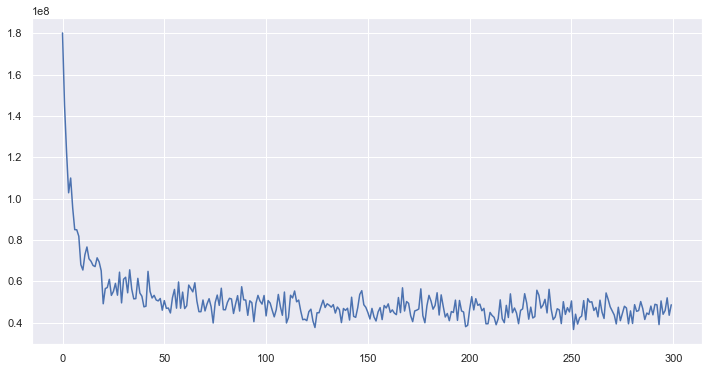

0.49659239665070254 0.4828498326691779


In [65]:
regr = LinearRegression(learning_rate=0.5,epochs=300,batch_size=3000)
regr.fit(X_train, y_train)

regr.plot_cost()

print(regr.score(X_test, y_test), regr.score(X_train, y_train))



посмотрим веса

<BarContainer object of 3 artists>

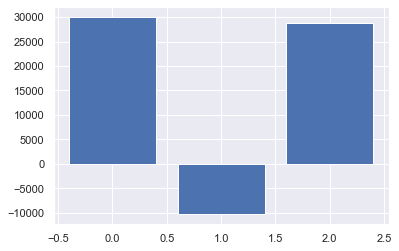

In [66]:
w, b = regr.get_w_and_b()
plt.bar(x = range(w.size),height=w)

## Регуляризация линейной регрессии

### Регуляризация Тихонова

Часто бывает так, что обычный градиентный спуск приводит к переобучению модели. Переобучение это ситуация, когда точность на обучающих данных значительно выше, чем на тестовых. В таких случаях также можно сказать, что данные плохо обусловлены - то есть любые небольшие изменения по отношению к тренировочной выборке приведут к большим изменениям в ответе модели. В целом это будет означать, что модель дает очень большой разброс результатов. Такой разброс может быть снижен при помощи различных техник регуляризации. Смысл использования таких техник сводится к тому, что при обучении модели к выражению обновления весовых параметров добавляется дополнительное условие. Например, можно добавить условие ограничение суммы квадратов весовых параметров. Такое предположение называется регрессией Тихонова или гребневой регрессией (а также L2 регуляризацией). Технически такая регуляризация соответствует предположению, что распределение результатов работы модели имеет вид нормального распределения. Такое предположение часто допустимо и оправдано.<br>
Регрессия Тихонова может быть записана в следующей форме:

$$ \begin{cases} 
L(\hat{y}_i,y_i)\to \min \\
\| W \|_2^2< \mathrm{const}
\end{cases}
\to L(\hat{y}_i,y_i) + \frac{\lambda}{2M}\sum_{j=1}^{N} W_j^2\to \min,
$$
где  <ul>
     <li> $ \| W \|_2^2 = \sum_{j=1}^{N} W_j^2$ - норма Фробениуса для вектора или матрицы;
     <li> $ \lambda $   - регуляризационный множетель;  
     <li> $N$ - размер вектора весовых параметров;
     <li> $M$ - объем выборки весовых параметров;   
    </ul>
Закон изменения весовых параметров для данной модели можно зписать как:
$$ W^t = W^{t-1}-\eta\frac{1}{M}\sum_{m=0}^{M-1}\nabla_{W}L(\hat{y}_i,y_i) + \frac{\lambda}{M}\sum_{j=1}^{N} W_j. $$
Запишем новую версию регрессии. Для этого запишем новый класс, наследующий от уже созданного и перепишем в нем методы `loss`     и `update`. Также отметим, что веса в регуляризации учитваются без смещения!

In [67]:
class RidgeRegression(LinearRegression):
    def __init__(self, 
                 learning_rate = 0.5,
                 l2_penalty = 0.001,
                 epochs = 100, 
                 weights = None, 
                 bias    = None, 
                 batch_size   = 1000, 
                 random_state = 42):
        
        super().__init__(learning_rate = learning_rate,
                         epochs = epochs, 
                         weights = weights, 
                         bias    = bias, 
                         batch_size   = batch_size, 
                         random_state = random_state)
        self.l2_penalty = l2_penalty
    #---------------------------------
    def loss(self,yhat, y):   
        l2_term = (self.l2_penalty/2)*np.sum(np.square(self.weights[1:]))/y.size
        return np.square(yhat - y).mean() + l2_term
                  
    
    #---------------------------------
    def update(self):    
        l2_term = self.l2_penalty*np.sum(self.weights[1:])
        return self.weights - self.lr*self.grad + l2_term  


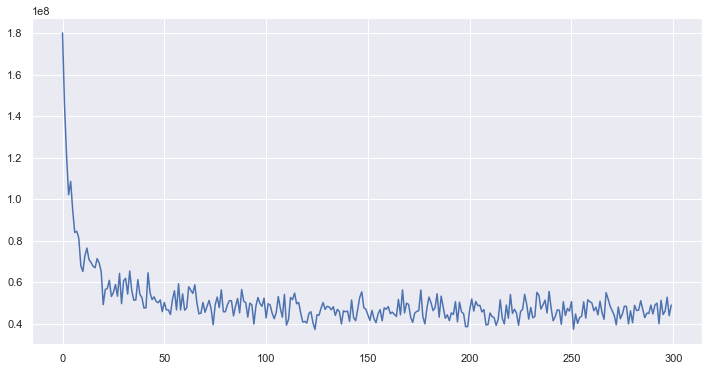

0.49676261435492663 0.47503163633930934


In [68]:
regr = RidgeRegression(learning_rate=0.5,epochs=300,batch_size=3000, l2_penalty = 0.003)
regr.fit(X_train, y_train)

regr.plot_cost()

print(regr.score(X_test, y_test), regr.score(X_train, y_train))

посмотрим веса

<BarContainer object of 3 artists>

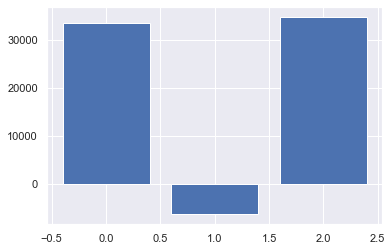

In [69]:
w, b = regr.get_w_and_b()
plt.bar(x = range(w.size),height=w)

### Регуляризация L1
В ряде случаев, когда разброс данных оказывается очень большим, регуляризации L2 может оказаться бесполезной или даже вредной. Дело в том, что в функции потерь мы учитываем веса в квадрате и большие колебания весовых параметров приведут к в квадрате большим колебаниям в значениях функции потерь. Часто эта ситуация является недопустимой. В таких случаях следует выбирать более устойчивые (робастные методы). Робастные методы могут быть менее точными, однако более стабильными. Одним из наиболее распространённых робастных методов является L1 регуляризация. В этом случае выражение для функции потерь может быть записано следующим образом:
$$ \begin{cases} 
L(\hat{y}_i,y_i)\to \min \\
\| W \|_1^1 \mathrm{const}
\end{cases}
\to L(\hat{y}_i,y_i) + \frac{\lambda}{2M}\sum_{j=1}^{N} W_j\to \min,
$$
где  <ul>
     <li> $ \| W \|_1^1 = \sum_{j=1}^{N} W_j$ - норма L1 для вектора или матрицы;
     <li> $ \lambda $   - регуляризационный множетель;  
     <li> $N$ - размер вектора весовых параметров;
     <li> $M$ - объем выборки весовых параметров;   
    </ul>
Закон изменения весовых параметров для данной модели можно зписать как:
$$ W^t = W^{t-1}-\eta\frac{1}{M}\sum_{m=0}^{M-1}\nabla_{W}L(\hat{y}_i,y_i) + \lambda. $$
Запишем новую версию регрессии. Для этого запишем новый класс, наследующий от уже созданного и перепишем в нем методы `loss`     и `update`.

In [70]:
class LassoRegression(LinearRegression):
    def __init__(self, 
                 learning_rate = 0.5,
                 l1_penalty = 0.001,
                 epochs = 100, 
                 weights = None, 
                 bias    = None, 
                 batch_size   = 1000, 
                 random_state = 42):
        
        super().__init__(learning_rate = learning_rate,
                         epochs = epochs, 
                         weights = weights, 
                         bias    = bias, 
                         batch_size   = batch_size, 
                         random_state = random_state)
        self.l1_penalty = l1_penalty
    
    #---------------------------------
    def loss(self,yhat, y):   
        l1_term = self.l1_penalty*np.sum(self.weights[1:])/y.size
        return np.square(yhat - y).mean() + l1_term
                  
    #---------------------------------
    def update(self):    
        return self.weights - self.lr*self.grad + self.l1_penalty 

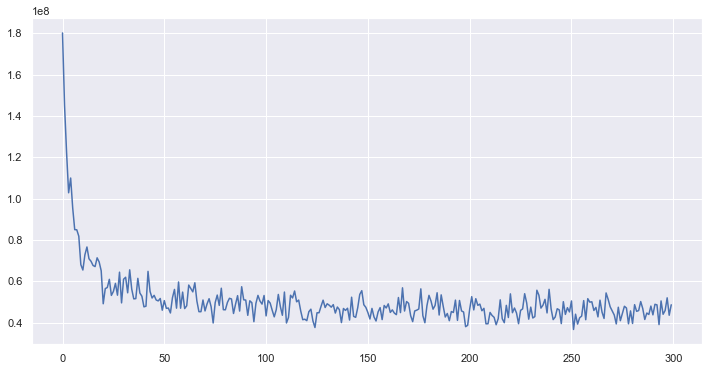

0.4965983027378985 0.4828525204940777


In [71]:
regr = LassoRegression(learning_rate=0.5,epochs=300,batch_size=3000, l1_penalty = 0.08)
regr.fit(X_train, y_train)

regr.plot_cost()

print(regr.score(X_test, y_test), regr.score(X_train, y_train))

посмотрим веса

<BarContainer object of 3 artists>

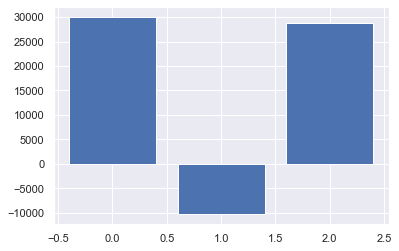

In [72]:
w, b = regr.get_w_and_b()
plt.bar(x = range(w.size),height=w)

### Эластичная регуляризация
Отметим, что во многих случаях неизвестно какая модель регуляризации окажется лучше, поэтому целисообразно использовать их обе вместе. Такая модель регуляризации называется эластической регуляризацией. Попробуем ее реализовать

In [73]:
class ElasticRegression(LinearRegression):
    def __init__(self, 
                 learning_rate = 0.5,
                 l1_penalty = 0.001,
                 l2_penalty = 0.001,
                 epochs = 100, 
                 weights = None, 
                 bias    = None, 
                 batch_size   = 1000, 
                 random_state = 42):
        
        super().__init__(learning_rate = learning_rate,
                         epochs = epochs, 
                         weights = weights, 
                         bias    = bias, 
                         batch_size   = batch_size, 
                         random_state = random_state)
        self.l1_penalty = l1_penalty
        self.l2_penalty = l2_penalty
    #---------------------------------
    def loss(self,yhat, y):   
        l1_term = self.l1_penalty*np.sum(self.weights[1:])/y.size
        l2_term = (self.l2_penalty/2)*np.sum(np.square(self.weights[1:]))/y.size
        return np.square(yhat - y).mean() + l1_term + l2_term
                  
    
    #---------------------------------
    def update(self):    
        l2_term = self.l2_penalty*np.sum(self.weights[1:])
        return self.weights - self.lr*self.grad + self.l1_penalty + l2_term

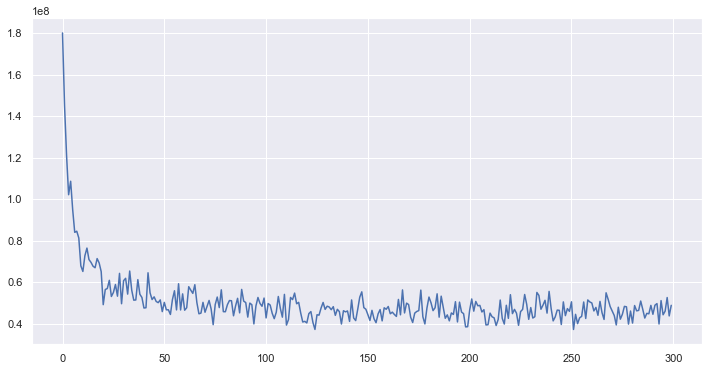

0.497590385433863 0.4766159158372453


In [74]:
regr = ElasticRegression(learning_rate=0.5,epochs=300,batch_size=3000, l1_penalty = 0.08,l2_penalty = 0.0028 )
regr.fit(X_train, y_train)

regr.plot_cost()

print(regr.score(X_test, y_test), regr.score(X_train, y_train))

посмотрим веса

<BarContainer object of 3 artists>

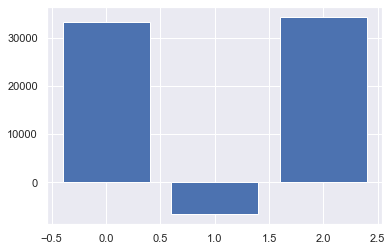

In [75]:
w, b = regr.get_w_and_b()
plt.bar(x = range(w.size),height=w)

###  Вопрос
1. посмотрите на значения весовых параметров в эластической регрессии, ответьте на вопрос, какая регуляризация в ней преобладает (L1, L2, никакая ).<br>


## Логистическая регрессия

Один из самых простых методов классификации — это логистическая регрессия. По существу, модель логистической регрессии представляет собой аналог линейной регрессии. Однако, если в случае линейной регрессии мы хотели провести линию через наши данные, то в случае логистической регрессии мы стремимся провести линию между двумя классами наших данных. Технически это сводится к тому, что введем функцию принятия решений для результата сопоставления наших данных и построенной линии.
Это можно описать как следующую модель:
$$ \hat{y}_i = \sigma \left(\sum_{j=0}^M w_jX_{ij}\right) \equiv \sigma \left(\sum_{j=1}^M w_jX_{ij}+b\right), $$
где <ul>
<li> $\sigma$ - функция принятия решений - функция активации;
<li> $ \hat{y}_i$ - результат принятия решений - класс экземпляра данных.
    </ul>
Из некоторых статистических выводов известно, что для такой модели необходимо выбрать функцию потерь следующего вида:
$$ L = -\frac{1}{M}\sum_{i=0}^{M-1}{y_i \log{\hat{y}_i}+(1-y_i)\log{(1-\hat{y}_i)}}$$

и следующий вид функции активации:
$$\sigma(z_i) = \frac{1}{1+\exp(-z_i)}, $$
где <ul>
    <li> $z_i = \sum_{j=0}^M w_jX_{ij} = X_iW^T$ - т.н. логит; 
     <li> тогда $\hat{y}_i =\sigma(X_iW^T) $.   </ul>
         
прежде чем записать выражение для градиента функции потерь запишем выражение для производной функции активации
$$ \sigma'(z_i) = \frac{\partial \sigma(z_i)}{\partial z_i} = (1-\sigma(z_i))\sigma(z_i) $$
Градиент функции потерь для одного элемента выборки может быть выражен следующим образом:
$$ 
\nabla_W L_i = 
-{
\left(\frac{y_i}{\sigma(X_iW^T)}-\frac{1-y_i}{1-\sigma(X_iW^T)}\right)\sigma'(X_iW^T)\odot X_i 
= -\left(y_i - \sigma(X_iW^T) \right)\odot X_i = -\left(y_i - \hat{y}_i\right)\odot X_i 
}
$$
Тогда правило обновления весовых параметров может быть записано как
$$ W^t = W^{t-1} + \eta\frac{1}{M}\sum_{i=0}^{M-1}\left(y_i - \hat{y}_i\right)\odot X_i.$$
Отметим, что данное выражение эквиваленто записанному для логистической регрессии с точностью до коэффициента $2$, поэтому мы учтем данный параметр путем замены $\eta \to \eta/2$.
<br>





рассмотрим графики функции активации сигмоид и ее производной

In [76]:
def sigmoid(z):
    return 1 / (1 + np.exp(-z)) 

def sigmoid_derivative(z):
    return sigmoid(z)*(1-sigmoid(z)) 

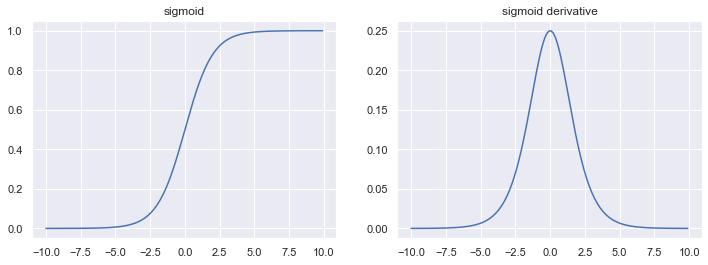

In [77]:
z = np.arange(-10,10,0.1)

plt.figure(figsize=(12,4))
plt.subplot(121); plt.plot(z,sigmoid(z)); plt.title('sigmoid')
plt.subplot(122); plt.plot(z,sigmoid_derivative(z)); plt.title('sigmoid derivative')
plt.show()

### Вопрос:
1. назовите значение функции сигмоид для z = 0 <br>


### Вопрос:
1. назовите значение  производной функции сигмоид для z = 0 <br>


Как правило, после расчета функции активации мы должны округлить значения до 0 или до 1. То есть до значения метки одного из классов. Такое округление можно сделать по заданному порогу результатов функции активации. Например, мы можем сказать, что если значение сигмоида больше 0.5 то пусть будет класс 1, а если меньше, то наоборот. Однако, на практике мы ставим более высокий порог, как правило 0.7 - 0.8. Запишем функцию определения класса.

Отметим, что в описанном смысле можно говорить о том, что результат сигмоида - это вероятность того, что аргумент функции (z) принадлежит одному из классов. Также отметим, что такой аргумент принято называть логит.



In [78]:
def to_class(logit, threshold = 0.7):
    return (logit>=threshold)*1

In [79]:
print( to_class(sigmoid(2.5), threshold = 0.7), ',',  to_class(sigmoid(-2.5), threshold = 0.7) )

1 , 0


Отметим, что для расчета функции потерь не следует пользоваться округлением до классов

### Вопрос:
1. Назовите к какому классу следует отнести результат функуии сигмоид для z = 5 <br>


### Вопрос:
1. Назовите к какому классу следует отнести результат функуии сигмоид для z = 0.1 если порог 0.5 <br>


### Вопрос:
1. Назовите к какому классу следует отнести результат функуии сигмоид для z = 0.0 если порог 0.2 <br>


Теперь рассмотрим функцию потерь. Отметим, что значениях логорифма мы ввели небольшую константу с целью исключить ошибку вида логорифм нуля.

In [80]:
_EPS_ = 1e-6
def loss(yhat, y):
    return -(y*np.log(yhat + _EPS_)+(1 - y)*np.log(1 - yhat + _EPS_)).mean()

для начала рассмотрим значение функции активации для предельных случаев значений вероятности.

In [81]:
print('ambiguity (yhat=0.5, y=1):\t %.3f'%loss(yhat=0.5, y=1))
print('ambiguity (yhat=0.5, y=0):\t %.3f'%loss(yhat=0.5, y=0))
print('zero class (yhat=0, y=0):\t %.3f'%loss(yhat=0.0, y=0))
print('first class(yhat=1, y=1):\t %.3f'%loss(yhat=1, y=1))
print('zero class error (yhat=0, y=1):\t %.3f'%loss(yhat=0.0, y=1))
print('first class error(yhat=1, y=0):\t %.3f'%loss(yhat=1, y=0))

ambiguity (yhat=0.5, y=1):	 0.693
ambiguity (yhat=0.5, y=0):	 0.693
zero class (yhat=0, y=0):	 -0.000
first class(yhat=1, y=1):	 -0.000
zero class error (yhat=0, y=1):	 13.816
first class error(yhat=1, y=0):	 13.816


### Вопрос:
1. Назовите предельное значение  ситуации flase positive <br>


### Вопрос:
1. Назовите предельную ошибку ситуации неопределенности <br>


Запишем все в один класс. Также добавим в функцию гребневую регуляризацию.

In [82]:
_EPS_ = 1e-6

class LogisticRegression(ElasticRegression):
    def __init__(self, 
                 learning_rate = 0.5,
                 l1_penalty = 0.0,
                 l2_penalty = 0.0,
                 epochs = 100, 
                 weights = None, 
                 bias    = None, 
                 threshold = 0.5,
                 batch_size   = 1000, 
                 random_state = 42):
        
        super().__init__(learning_rate = learning_rate,
                         epochs = epochs, 
                         weights = weights, 
                         bias    = bias, 
                         batch_size   = batch_size, 
                         random_state = random_state,
                         l1_penalty = l1_penalty,
                         l2_penalty = l2_penalty)       
        self.learning_rate = learning_rate/2
        self.threshold = threshold
    
    #---------------------------------    
    def loss(self,yhat, y):
        
        l1_term = self.l1_penalty*np.sum(self.weights[1:])/y.size
        l2_term = (self.l2_penalty/2)*np.sum(np.square(self.weights[1:]))/y.size
        
        return -(y*np.log(yhat  + _EPS_)+(1 - y)*np.log(1 - yhat  + _EPS_)).mean()\
            + l1_term+ l2_term 
    
    #---------------------------------
    def sigmoid(self, z):
        return 1 / (1 + np.exp(-z)) 
    
    #---------------------------------
    def forward(self, X):        
        return self.sigmoid(self.weights.dot(X.T))
    
    #---------------------------------
    def to_class(self,logit):
        return (logit>=self.threshold)*1
    
    #---------------------------------
    def predict(self, X):
        yhat = self.forward(self.add_bias(X))
        
        if self.threshold:
            return self.to_class(yhat)
        else:
            return yhat
    #---------------------------------
    def score(self, X, y):
        yhat  = self.predict(X)
        return sum((yhat==y)*1)/y.size
    
    #---------------------------------
    def classification_report(self, X,y):
        tp = 0 # true_positives
        tn = 0 # true_negatives
        fp = 0 # false_positives
        fn = 0 # false_negatives
        
        yhat  = self.predict(X)
        total = yhat.size
        
        for yhati,yi in zip(yhat,y):
            if yi == 1 and yhati == 1:
                tp += 1
            elif yi == 0 and yhati == 0:
                tn += 1
            elif yi == 1 and yhati == 0:
                fn += 1
            elif yi == 0 and yhati == 1:
                fp += 1

        print('True Positives:%.4f'%(tp/total), end = '\t')
        print('True Negatives:%.4f'%(tn/total))
        print('False Positives:%.4f'%(fp/total), end = '\t')
        print('False Negatives:%.4f'%(fn/total))
        print('Accuracy:%.4f'% ((tp + tn) / total))
        print('Recall:%.4f'% (tp / (tp + fn)), end = '\t')
        print('Precision:%.4f'%(tp / (tp + fp)))
        print('f1 measure:%.4f'%(tp / (tp + 0.5*(fp+fn))))

Запишим данные для классификации.

In [83]:
X = df_num
y = df_se["Transmission"].values 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


scaler  = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test) 
pd.DataFrame(X_train).tail()

,0,1,2,3
22446,0.64,0.479896,0.353333,0.046092
22447,0.74,0.465893,0.479167,0.077144
22448,0.70,0.572360,0.333333,0.058106
22449,0.70,0.581916,0.375000,0.046593
22450,0.24,0.579916,0.000000,0.008016


Проведем тестирование без регуляризации 

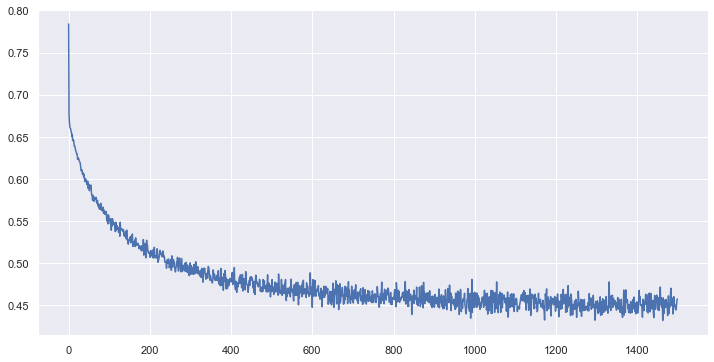

0.8139873220409436 0.8066010422698321
True Positives:0.3417	True Negatives:0.4723
False Positives:0.0736	False Negatives:0.1124
Accuracy:0.8140
Recall:0.7524	Precision:0.8228
f1 measure:0.7860


In [84]:
regr = LogisticRegression(learning_rate=0.8,epochs=1500,batch_size=5000, l2_penalty = 0.000)

regr.fit(X_train, y_train)

regr.plot_cost()

print(regr.score(X_test, y_test), regr.score(X_train, y_train))

regr.classification_report(X_test, y_test)

Посмотрим веса

<BarContainer object of 4 artists>

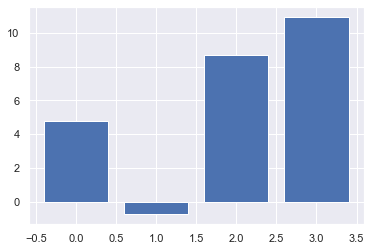

In [85]:
w, b = regr.get_w_and_b()
plt.bar(x = range(w.size),height=w)

Проведем тест с регуляризацией L2

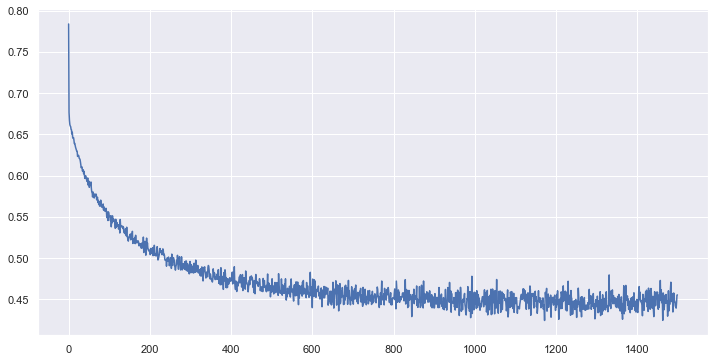

0.8172087706536423 0.8080263685359227
True Positives:0.3485	True Negatives:0.4687
False Positives:0.0772	False Negatives:0.1056
Accuracy:0.8172
Recall:0.7675	Precision:0.8186
f1 measure:0.7923


In [86]:
regr = LogisticRegression(learning_rate=0.8,epochs=1500,batch_size=5000, l2_penalty = 0.0003)

regr.fit(X_train, y_train)

regr.plot_cost()

print(regr.score(X_test, y_test), regr.score(X_train, y_train))

regr.classification_report(X_test, y_test)

<BarContainer object of 4 artists>

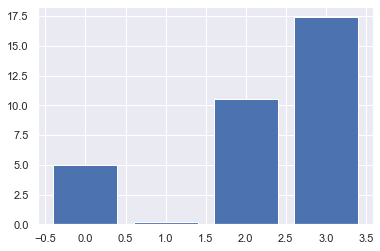

In [87]:
w, b = regr.get_w_and_b()
plt.bar(x = range(w.size),height=w)

Проведем тест с L1 регуляризацией

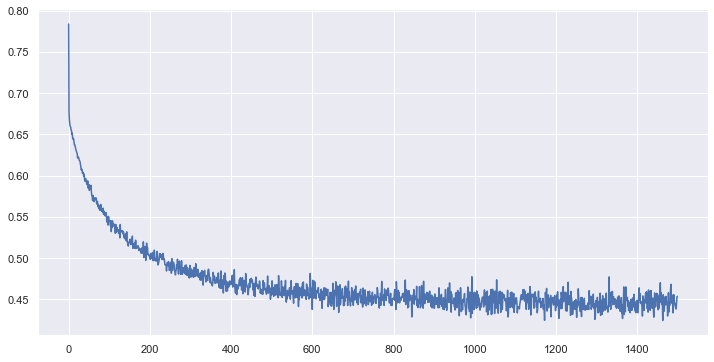

0.8158578405902526 0.8078927441984767
True Positives:0.3452	True Negatives:0.4706
False Positives:0.0752	False Negatives:0.1089
Accuracy:0.8159
Recall:0.7602	Precision:0.8211
f1 measure:0.7894


In [88]:
regr = LogisticRegression(learning_rate=0.8,epochs=1500,batch_size=5000, l1_penalty = 0.005)

regr.fit(X_train, y_train)

regr.plot_cost()

print(regr.score(X_test, y_test), regr.score(X_train, y_train))

regr.classification_report(X_test, y_test)

<BarContainer object of 4 artists>

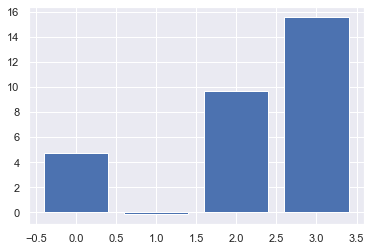

In [89]:
w, b = regr.get_w_and_b()
plt.bar(x = range(w.size),height=w)

Эластичная регрессия

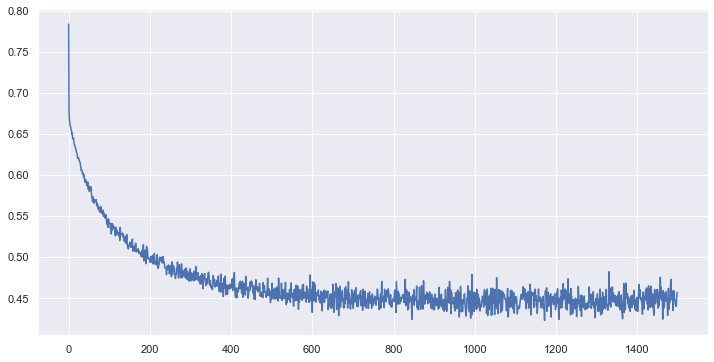

0.8165852644705394 0.8085163244398913
True Positives:0.3495	True Negatives:0.4671
False Positives:0.0788	False Negatives:0.1046
Accuracy:0.8166
Recall:0.7696	Precision:0.8161
f1 measure:0.7921


In [90]:
regr = LogisticRegression(learning_rate=0.8,epochs=1500,batch_size=5000, l1_penalty = 0.008, l2_penalty = 0.00005)

regr.fit(X_train, y_train)

regr.plot_cost()

print(regr.score(X_test, y_test), regr.score(X_train, y_train))

regr.classification_report(X_test, y_test)

<BarContainer object of 4 artists>

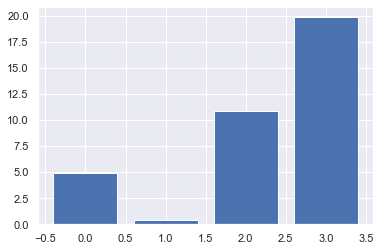

In [91]:
w, b = regr.get_w_and_b()
plt.bar(x = range(w.size),height=w)

### Вопрос
1. Во всех приведенных выше примерах видно, что один из параметров практически не используется для классификации, ответьте какой среди анализируемых столбцов.


Посмотрим, можно ли проводить классификацию без излишнего параметра.

In [331]:
w, b = regr.get_w_and_b()

w[1] = 0

regr = LogisticRegression(learning_rate=0.8,
                          epochs=1500,
                          batch_size=5000, 
                          l1_penalty = 0.005,
                          weights = w,
                          bias = b)

print(regr.score(X_test, y_test), regr.score(X_train, y_train))

regr.classification_report(X_test, y_test)

0.8153382521043334 0.8081154514275534
True Positives:0.3495	True Negatives:0.4659
False Positives:0.0800	False Negatives:0.1046
Accuracy:0.8153
Recall:0.7696	Precision:0.8137
f1 measure:0.7910


### Вопрос
1. Назовите параметр, который в наибольшей степени связан с целевой переменной.


## Метод главных компонент


Метод главных компонент - это метод снижения размерности данных путем преобразования их в такую форму, чтобы оставить только максимально полезную информацию. Метод работает без учителя, поэтому под термином полезная информация в данном методе понимается набор независимых друг от друга признаков с максимальной дисперсией (с максимальным разбросом значений). При этом мы изначально полагаем, что интенсивность (в некотором смысле) полезной информации преобладает над интенсивностью каких-то случайных искажений или других не идеальностей нашего набора данных. Для выделения полезной информации в методе главных компонент проводится преобразование данных от набора исходных столбцов (исходных признаков), которые могут содержать шумы и быть линейно зависимыми к набору новых столбцов, которые обладают важным свойством линейной независимости (не коррелируют). Такие новые столбцы можно изобразить как некоторую систему координат, в которых можно отложить точки - наши данные. При этом часто оказывает так, что некоторые из координат не нужны - в них почти наверняка нет информации. Это можно представить, как если мы возьмём двухмерную фигуры и будем строить ее в трехмерной плоскости. При этом окажется, что можно выбрать такую систему координат, что третья ось не нужна. При этом даже если мы возьмём трехмерную цельную фигуры, но по одной из осей у нас будет "совсем чуть-чуть", то можно рассмотреть этот случай как двухмерный. В нашем примере две оси, в которых будет основная часть фигуры будут главными компонентами. Совокупность наших главных компонент образует т.н. собственное подпространство. Третья ось останется т.н. шумовым подпространством. Как видно из примера размерность фигуры в каждой из обозначенных осей будет соответствовать важности этой оси. Другими словами, можно сказать что разброс значений в каждой оси будет соответствовать ее важности. Такой разброс значений по каждой оси будет называться - собственные значения. Сортируя собственные значения по убыванию, мы можем определить те из них, которые следует оставить и те, которые следует убрать. Цель Метода Главных компонент найти и отбросить шумовое подпространство.

Классический метод главных компонент состоит из следующих операций:
1.	вычисление ковариационной матрицы для набора данных - то есть матрицу дисперсий.
2.	вычисление (поиск) собственных векторов и их собственных значений по ковариационной матрице.
3.	сортировка собственных значений по убыванию.
4.	выделения собственного подпространства.
5.	преобразование данных - построение проекции исходного массива на полученные собственные вектора.

1-4 операции будут реализованы функцией `fit` последняя операция будет реализована функцией `transform`. Также нами будет реализована операция `inverse_transform`, необходимая для восстоновления исходного набора данных. Важно отметить, что на практике такое восстановление может быть не точным так как сокращая разность данных вы можете удалить оттуда и часть полезной информации. Оценку точности восстоновления можно провести по метрике $R_2$, которая обсуждалась выше.

Отметим, что известно, что собственные вектора и собственные значения для некоторой квадратной матрицы $A$ удовлетворяют следующему уравнению:
$$A\vec{V}_i = \lambda_i\vec{V}_i,$$
где $\vec{V}_i$ - это собственный вектор; $\lambda_i$ - соответствующее собственное значение. По сути выражение выше представляет собой решение системы линейных уравнений с параметром $\lambda_i$. Значения данного параметра можно найти из следующего выражения:
$$ det(A-\lambda_I) = 0, $$
где $det$ - операция поиска определителя матрицы, а $\lambda_I$ - диагональная матрица с собственными значениями по главной диагонали и нулями в остальных позициях. При раскрытие операции детерменент по определению данное уравнение может быть сведено к поиску корней полнинома.





In [92]:
class PCA:
    def __init__(self, n_components):
        self.n_components = n_components
        self.components = None
        self.values = None
        self.mean = None
    
    #--------------------------------    
    def fit(self, X):

        self.mean = np.mean(X, axis=0)
        
        # decomposition of the covariance function
        cov_matrix = np.cov(X - self.mean, rowvar = False)
        
        eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

        idx = eigenvalues.argsort()[::-1] #the highest values
        
        # eigen sub-space is the first n eigenvectors
        self.components = eigenvectors[:, idx][:, :self.n_components]
        self.values     = eigenvalues[idx]
        
        return self
    
    #--------------------------------
    def transform(self, X):
        X = X - self.mean
        return np.dot(X, self.components)
    #--------------------------------
    def fit_transform(self, X):
        return self.fit(X).transform(X)
    #--------------------------------
    def inverse_transform(self, X_new):
        return np.dot(X_new, self.components.T) + self.mean
    #--------------------------------
    def score(self, X):
        SStot = np.sum(np.square(X - np.mean(X)))
        SSres = np.sum(np.square(X - self.inverse_transform(self.fit_transform(X))))
        return 1 - SSres/SStot
    #--------------------------------
    def plot_eigvalues(self, figsize=(12,4)):
        plt.figure(figsize=figsize)
        plt.plot(self.values, label='all eigvalues')
        plt.plot(self.values[:self.n_components],'-o', label='eigen subspace')
        plt.title('eigenvalues');plt.legend();plt.show()
    


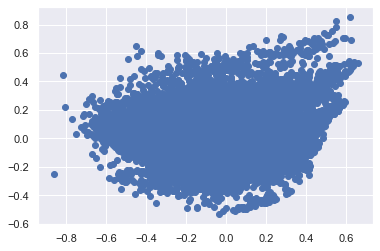

eigenvalues [0.04203692 0.01886132 0.01399888 0.00369163]


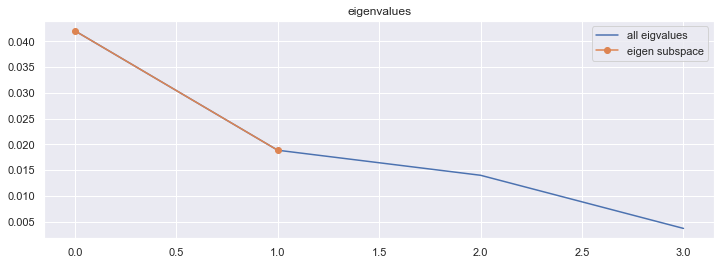

score: 0.9403754785630425


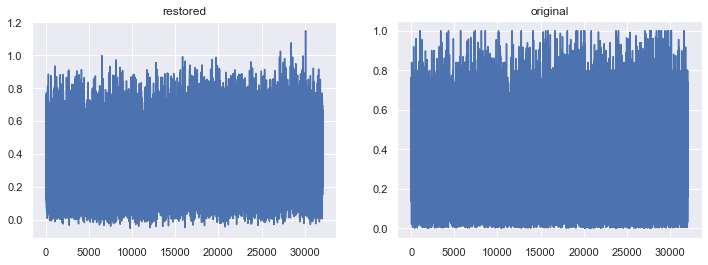

In [93]:
df_num = df[num_columns].copy()
scaler = MinMaxScaler()
X = scaler.fit_transform(df_num)

pca = PCA(n_components = 2)
pca.fit(X)
X_new = pca.transform(X)
plt.scatter(X_new[:,0], X_new[:,1]); 
plt.show()

print('eigenvalues',pca.values)
pca.plot_eigvalues()

print('score:',pca.score(X))

X2 = pca.inverse_transform(X_new)
plt.figure(figsize=(12,4))
plt.subplot(121);plt.plot(X2[:,1]);plt.title('restored')
plt.subplot(122);plt.plot(X[:,1]);plt.title('original')
plt.show()


Проверим тот же набор, что был для sklearn

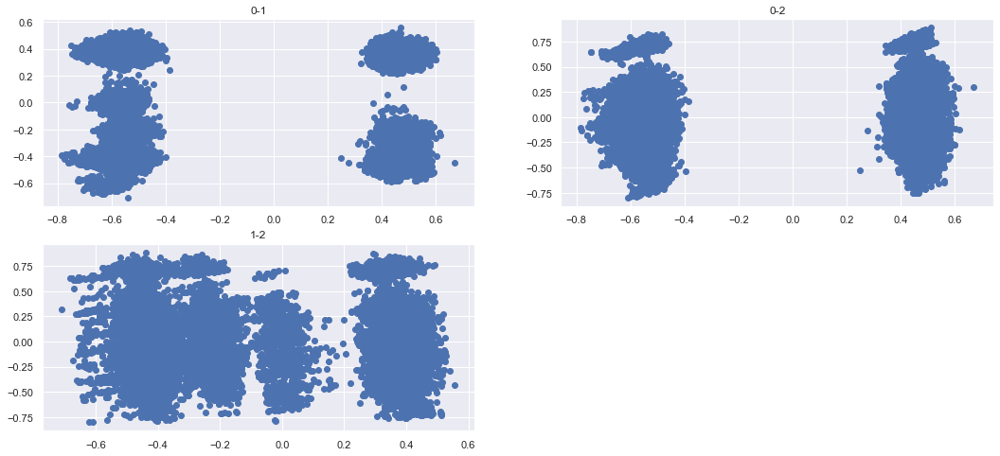

score: 0.7960056096196488


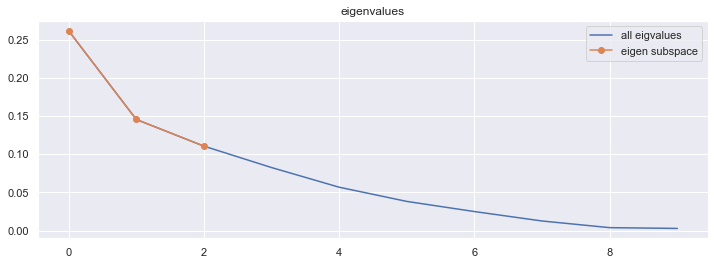

In [94]:
scaler    = MinMaxScaler()
X_cluster = scaler.fit_transform(df_se)
pca = PCA(n_components=3)

X_new = pca.fit_transform(X_cluster)
X_new.shape

plt.figure(figsize=(18,8))
plt.subplot(221); plt.scatter(X_new[:,0],X_new[:,1]); plt.title("0-1")
plt.subplot(222); plt.scatter(X_new[:,0],X_new[:,2]); plt.title("0-2")
plt.subplot(223); plt.scatter(X_new[:,1],X_new[:,2]); plt.title("1-2")
plt.show();

print('score:',pca.score(X_cluster))
pca.plot_eigvalues()



### Вопрос:
1. назовите значение точности преобразования (и Восстановления) методом главных компонент, если дисперсия данных 0.4, а дисперсия остатков восстановления по главным компонентам 0.1   <br>


## Кластеризация k-средних

В ряде случаев при анализе данных оказывается так, что про данные ничего не известно, однако хочется понять на сколько они однородны или, например, могут быть разделены на группы. Такие группы можно назвать кластерами. Задача разделения на кластеры не требует наличия учителя. Другими словами, мы пытаемся найти закономерности в данных как таковых без привязки к тому, какие результаты для них мы хотим получить.<br>

 Одним из самых простых методов кластеризации является метод k-средних.
Суть данного метода сводится к тому, чтобы найти заданное число кластеров (k) и их центры (т.н. центроиды) таких, чтобы расстояние от центроидов до всех точек кластера было минимальным.

Алгоритм k-средних может быть описан следующим образом <ul>
<li>выбирается к случайным точкам - центроиды.
<li>рассчитывается вектор расстояние между каждой точкой набора данных и каждым центроидом.
<li>в каждый кластер записываются те точки для которых оказалось, что для соответствующего центроида расстояние меньше, чем для других.
<li>новые значение центроидов рассчитываются как среднее значение по всем точкам кластера.


In [95]:
df_num = df[num_columns].copy()
scaler = MinMaxScaler()
X = scaler.fit_transform(df_num)
X.shape

(32074, 4)

Рассчитаем расстояние как сумму разностей квадратов.

In [96]:
def distance(X1, X2):
    return np.sqrt(np.sum(np.square(X1 - X2).T,axis=0))

Проведем несколько тестов, функция работает как с векторами, так и матрицами равной размерности.

In [97]:
print(distance(X[0], X[1]))
print(distance(X[:5], X[10:15]))
print(distance(X[0], X[10:15]))

0.14824394928129211
[0.37527846 0.60674115 0.27679969 0.15344456 0.363898  ]
[0.37527846 0.47630497 0.14707452 0.15696026 0.15360423]


### вопрос:
1. если есть три центроида С1:(1,0,0);  С2:(0,1,1) и С3:(1, 0, 1) и точка (2,0,2), к какому кластеру ее следует отнести?  <br>


Прежде чем проводить кластеризацию необходимо проинициализировать калстеры.<br>
Для этого выберем случайные индексы среди доступных в наборе данных.

In [98]:
def init_centroids(X, n_clusters):
    centroid_idxs = np.random.randint(0, X.shape[0], size = n_clusters)
    return X[centroid_idxs,:]


посмотрим как это работает для двух кластеров

In [99]:
n_clusters = 2
centroids = init_centroids(X, n_clusters)
print(centroids)

[[0.84       0.35987197 0.25       0.02805611]
 [0.72       0.31186237 0.25       0.01903808]]


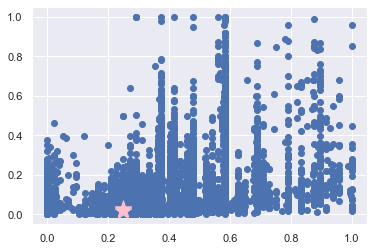

In [100]:
plt.scatter(X[:, 2], X[:, 3])
plt.scatter(centroids[:, 2], centroids[:, 3], marker='*', s=300, c='pink')
plt.show()

Проведем первую кластеризацию. Для этого возьмем каждый центроид и посчитаем расстояние от него до все записей набора данных. <br>
Индексы значений для каждого кластера выберем как индексы минимальных расстояний до соответствующего центроида. <br>
Таким образом, нулевой кластер будет включать те точки набора данных, в которых расстояние до нулевого центроида меньше, чем до первого центроида.

In [101]:
def predict(X, n_clusters, centroids):
    distances = np.zeros((X.shape[0], n_clusters))

    for i,centr in enumerate(centroids):
        distances[:,i] = distance(centr,X)

    cluster_label = np.argmin(distances,axis = 1)
    return cluster_label

посмотрим как распределились результаты кластеризации

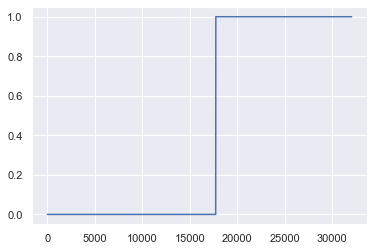

In [102]:
cluster_label=predict(X, n_clusters, centroids)
plt.plot(np.sort(np.copy(cluster_label)))

Проверим результаты первой кластеризации

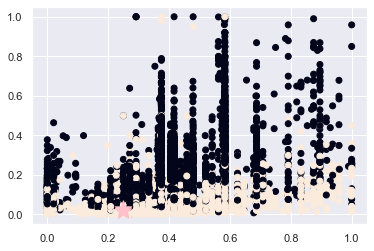

In [103]:
plt.scatter(X[:, 2], X[:, 3], c = cluster_label)
plt.scatter(centroids[:, 2], centroids[:, 3], marker='*', s=300, c='pink')
plt.show()

Теперь выберем новые центроиды, для этого нам понадобиться выбрать каждый кластер по отдельности.
<br> Новый центроид для каждого кластера выберем как среднее значение по кластеру.<br>
Расмотрим для начала пример с 0 кластером.<br>
В визуализации вы увидите старый центроид как звезду и новый как красный круг.

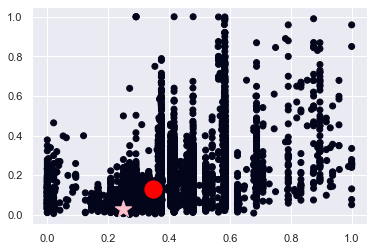

In [104]:
c_idxs = np.flatnonzero(cluster_label==0)
cluster_zero = X[c_idxs]
new_centroid = cluster_zero.mean(axis = 0)
plt.scatter(cluster_zero[:, 2], cluster_zero[:, 3], c = cluster_label[c_idxs])
plt.scatter(centroids[0, 2], centroids[0, 3], marker='*', s=300, c='pink')
plt.scatter(new_centroid[2], new_centroid[3], marker='o', s=300, c='red')

Проведем такую операцию для всех кластеров.

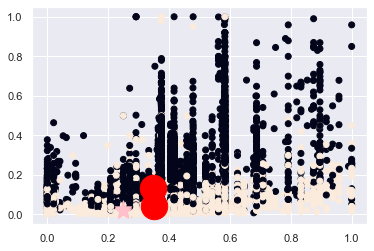

In [105]:
old_centroids = np.copy(centroids)

for k in range(n_clusters):
    c_idxs = np.flatnonzero(cluster_label==k)
    centroids[k] = X[c_idxs].mean(axis = 0)
    
plt.scatter(X[:, 2], X[:, 3], c = cluster_label)
plt.scatter(centroids[:,2], centroids[:,3], marker='o', s=700, c='red')
plt.scatter(old_centroids[:, 2], old_centroids[:, 3], marker='*', s=300, c='pink')


Рассчитаем относительное расстояние между старыми и новыми центроидами. Если расстояние между обновленными центроидами будет сравнительно небольшим - то есть центроиды перестанут менять позицию, то мы будем считать что кластеризация закончена.

In [106]:
def delta_centroids(centroids,old_centroids):
    return (distance(centroids,old_centroids)/distance(old_centroids, np.mean(old_centroids))).mean()

delta_centroids(centroids,old_centroids)

0.2683003255224754

Попробуем создать процедуры итерационной кластеризации. В кноце процедуры выведем результирующий номер итерации и расстояние между кластерами

In [107]:
def fit(X, n_clusters, centroids, max_iter=10, tol=0.01):
    
    dcentr = np.inf
    
    for i in range(max_iter):
        
        old_centroids = np.copy(centroids)
        cluster_label=predict(X, n_clusters, centroids)
        
        for k in range(n_clusters):
            c_idxs = np.flatnonzero(cluster_label==k)
            centroids[k] = X[c_idxs].mean(axis = 0)
        
        dcentr = delta_centroids(centroids,old_centroids)
        
        if dcentr<=tol:
            break
    
    print('stop on iter:', i,'with relative distance change: ',dcentr)
            
    return cluster_label

проверим и визуализируем результаты:

In [108]:
old_centroids = np.copy(centroids)

cluster_label = fit(X, n_clusters, centroids, max_iter=100, tol=0.001)

stop on iter: 8 with relative distance change:  0.000935213131132828


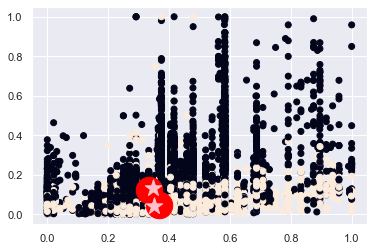

In [109]:
plt.scatter(X[:, 2], X[:, 3], c = cluster_label)
plt.scatter(centroids[:,2], centroids[:,3], marker='o', s=700, c='red')
plt.scatter(old_centroids[:, 2], old_centroids[:, 3], marker='*', s=300, c='pink')

Теперь объеденим все наши наработки в один класс.

In [110]:
class KMeans():
    def __init__(self,n_clusters = 2, centroids = None, max_iter=10, tol=0.01):
        self.n_clusters = n_clusters
        self.centroids  = centroids
        self.max_iter   = max_iter        
        self.tol        = tol
        self.iters      = None
    #-------------------------------------    
    def distance(self, X1, X2):
        return np.sqrt(np.sum(np.square(X1 - X2).T,axis=0))
    #-------------------------------------
    def init_centroids(self, X):
        c_idxs = np.random.randint(0, X.shape[0], size = self.n_clusters)
        return X[c_idxs,:]
    #-------------------------------------
    def predict(self, X):
        distances = np.zeros((X.shape[0], self.n_clusters))

        for i,centr in enumerate(self.centroids):
            distances[:,i] = self.distance(centr,X)

        return np.argmin(distances,axis = 1) # cluster label
    #-------------------------------------
    def delta_centroids(self,old_centroids):
        return (
                distance(self.centroids,old_centroids)/
                distance(old_centroids, np.mean(old_centroids))
               ).mean()
    #-------------------------------------
    def fit(self, X):
        
        if self.centroids is None:
            self.centroids = self.init_centroids(X)
    
        d_centrs = np.inf

        for i in range(self.max_iter):

            old_centroids = np.copy(self.centroids)
            
            cluster_label = self.predict(X)

            for k in range(self.n_clusters):
                
                c_idxs = np.flatnonzero(cluster_label==k)
                
                self.centroids[k] = X[c_idxs].mean(axis = 0)

            d_centrs = self.delta_centroids(old_centroids)

            self.iters = i
            if d_centrs<=self.tol:
                break
        return self        
    #-------------------------------------
    def fit_transform(self, X):
        return self.fit(X).predict(X)
    
    

Проверим как это работает. Отметим, что в данном примере мы проведем кластеризацию на двух-мерной выборке данных. Это будет правильней с точки зрения визуализации.

stop on iter: 24


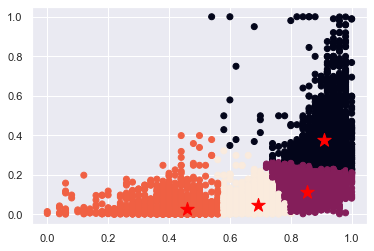

In [111]:
kmeans   = KMeans(n_clusters=4, max_iter=1000, tol=0.0001)
c_labels = kmeans.fit_transform(X[:,[0,3]])

print('stop on iter:',kmeans.iters)

plt.scatter(X[:, 0], X[:, 3], c = c_labels)

plt.scatter(kmeans.centroids[:,0], kmeans.centroids[:,1],marker='*', s=200, c='red')

Также проверим результаты для резуьтата сжатия размерности методом главных компонент набора данных `df_se`

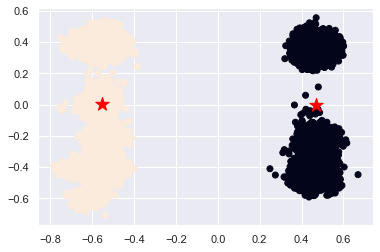

stop on iter: 1


In [112]:
scaler    = MinMaxScaler()
X_cluster = scaler.fit_transform(df_se)

pca = PCA(n_components=2)

X_new = pca.fit_transform(X_cluster)

kmeans   = KMeans(n_clusters=2, max_iter=1000, tol=0.00001)
c_labels = kmeans.fit_transform(X_new)

plt.scatter(X_new[:,0],X_new[:,1], c = c_labels);
plt.scatter(kmeans.centroids[:,0], kmeans.centroids[:,1],marker='*', s=200, c='red')
plt.show();
print('stop on iter:',kmeans.iters)

### Задача 1

добавьте к регрессииям метод стохастического градиентного спуска с моментом, который,  в самом простом случае может быть выражен следующим правилом обновления весовых пареметров:
$$W^t = \beta W^{t-1} - \eta \nabla_W L + (1-\beta) W^{t-2}, $$
где $\beta < 1$.

Проверьте результаты для линейных и логистических регрессий

### Задача 2 
Добавьте к алгоритму логистической регрессии возможность обрабатывать категориальные данные как таковые.

### Задача 3
Добавьте к алгоритму метода главных компонент возможность выбора относиетльного числа компонент (например 25%) от всех возможных.

### Задача 4
Добавьте к алгоритму кластеризации условие обучения: среднее расстояние между центроидом и его кластером меньше, чем между двумя центроидами (условия не попадания одного центриода в кластер другого в среднем).

# Часть 3. Готовые алгоритмы

# Обучение без учителя

## PCA

In [35]:
scaler    = MinMaxScaler()
X_cluster = scaler.fit_transform(df_se)

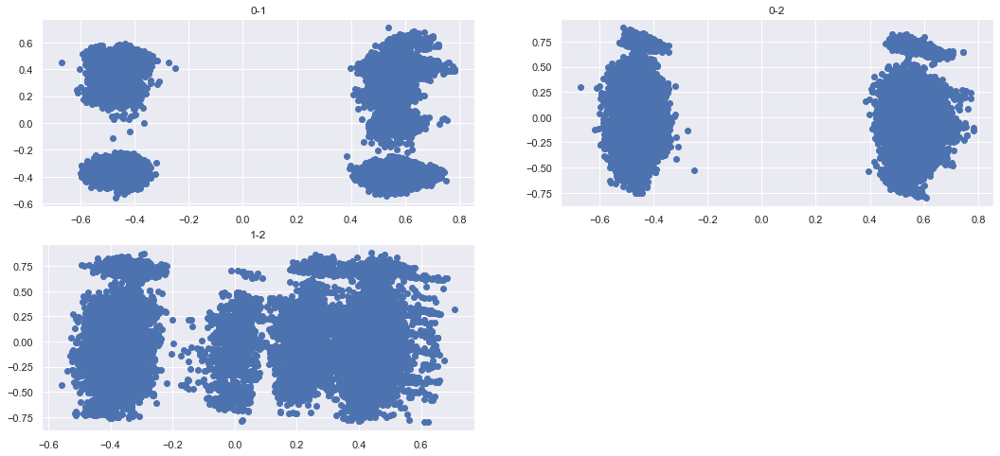

In [36]:
from sklearn.decomposition import PCA
X_new  = PCA(n_components=3).fit_transform(X_cluster)
X_new.shape

plt.figure(figsize=(18,8))
plt.subplot(221); plt.scatter(X_new[:,0],X_new[:,1]); plt.title("0-1")
plt.subplot(222); plt.scatter(X_new[:,0],X_new[:,2]); plt.title("0-2")
plt.subplot(223); plt.scatter(X_new[:,1],X_new[:,2]); plt.title("1-2")
plt.show();

### Clustering

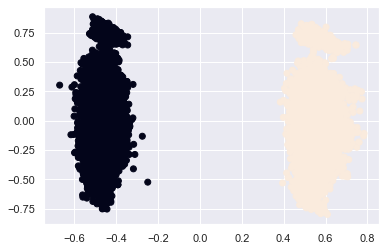

In [37]:
from sklearn import cluster 

X_new  = PCA(n_components=5).fit_transform(X_cluster)

kmeans = cluster.KMeans(n_clusters=2, n_init=100)
kmeans.fit(X_new)
labels = kmeans.predict(X_new)

plt.scatter(X_new[:,0], X_new[:,2],c =labels );   

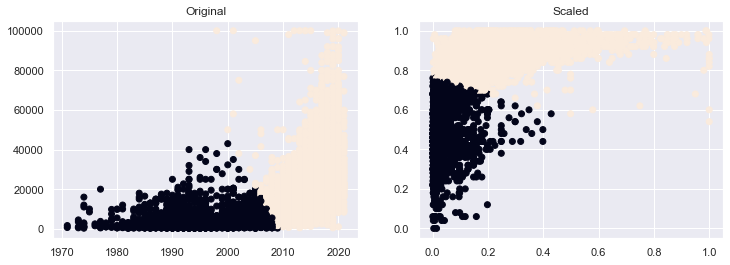

In [38]:
df_test = df[["Price(euro)","Year"]]

X_cluster = scaler.fit_transform(df_test)

kmeans = cluster.KMeans(n_clusters=2, n_init=100)
kmeans.fit(X_cluster)
labels = kmeans.predict(X_cluster)

plt.figure(figsize=(12,4))
plt.subplot(121);plt.scatter(df["Year"],df["Price(euro)"],  c = labels); plt.title('Original')
plt.subplot(122);plt.scatter(X_cluster[:,0],X_cluster[:,1],  c = labels); plt.title('Scaled')
plt.show();

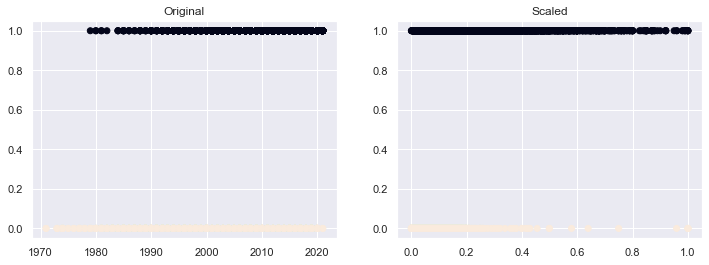

In [39]:
df_test = df_se[["Price(euro)","Transmission"]]

X_cluster = scaler.fit_transform(df_test)

kmeans = cluster.KMeans(n_clusters=2, n_init=100)
kmeans.fit(X_cluster)
labels = kmeans.predict(X_cluster)

plt.figure(figsize=(12,4))
plt.subplot(121);plt.scatter(df["Year"],df["Transmission"],  c = labels); plt.title('Original')
plt.subplot(122);plt.scatter(X_cluster[:,0],X_cluster[:,1],  c = labels); plt.title('Scaled')
plt.show();

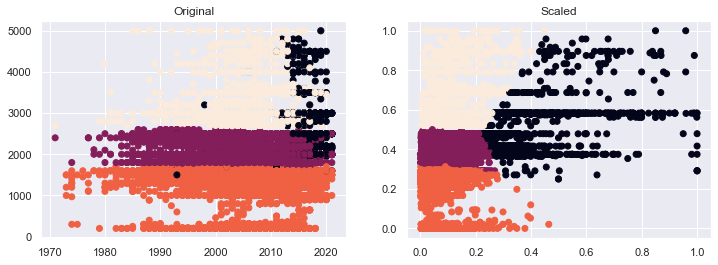

In [40]:
df_test = df_se[["Price(euro)","Engine_capacity(cm3)"]]

X_cluster = scaler.fit_transform(df_test)

kmeans = cluster.KMeans(n_clusters=4, n_init=100)
kmeans.fit(X_cluster)
labels = kmeans.predict(X_cluster)

plt.figure(figsize=(12,4))
plt.subplot(121);plt.scatter(df["Year"],df["Engine_capacity(cm3)"],  c = labels); plt.title('Original')
plt.subplot(122);plt.scatter(X_cluster[:,0],X_cluster[:,1],  c = labels); plt.title('Scaled')
plt.show(); 

# Обучение с учителем

## Prediction problem

<AxesSubplot:>

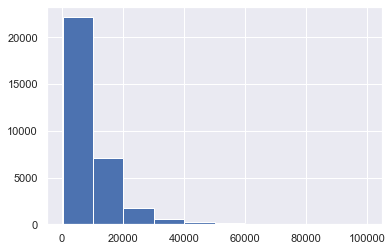

In [369]:
y = df_se["Price(euro)"]
X = df_se.drop(["Price(euro)"], axis = 1)
y.hist()

In [370]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
pd.DataFrame(X_train).tail()

,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Transmission,km_year
9473,4,12,2013,10,169000.0,3000.0,0,1,18777.777778
6871,41,80,2015,10,123263.0,1500.0,0,0,17609.000000
23443,39,39,2011,9,185000.0,3000.0,0,1,16818.181818
8618,4,12,2018,10,76777.0,1998.0,5,1,19194.250000
27498,4,6,2017,11,123000.0,2000.0,0,1,24600.000000


In [43]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

pd.DataFrame(X_train).tail()

,0,1,2,3,4,5,6,7,8
22446,0.072727,0.090226,0.90,0.909091,0.214201,0.583333,0.0,1.0,0.355975
22447,0.672727,0.917293,0.46,0.909091,0.679936,0.333333,0.8,0.0,0.241340
22448,0.309091,0.624060,0.44,1.000000,0.666599,0.375000,0.8,0.0,0.228342
22449,0.072727,0.067669,0.52,1.000000,0.549686,0.374167,0.6,0.0,0.218347
22450,0.581818,0.360902,0.86,0.909091,0.313863,0.004167,0.0,1.0,0.391283


In [44]:
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor(n_estimators=100, max_depth=50, random_state=42)
rfr.fit(X_train, y_train)

train_predictions = rfr.predict(X_train)
train_score = rfr.score(X_train,y_train)

test_predictions = rfr.predict(X_test)
test_score = rfr.score(X_test,y_test)

print(test_score,train_score)

0.836415670459103 0.9741791666197407


In [45]:
print(test_predictions[:5])
print(y_test.values[:5])

[ 6159.74  2720.62 18901.79  3614.45  2145.17]
[ 6600.  1500. 17600.  2000.  3700.]


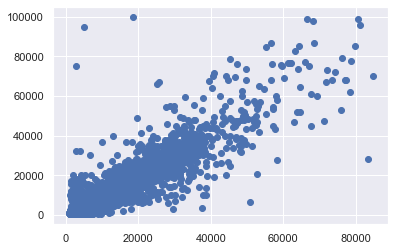

In [46]:
plt.scatter(test_predictions,y_test)

In [47]:
from sklearn.ensemble import ExtraTreesRegressor
etr = ExtraTreesRegressor(n_estimators=30, random_state=42)
etr.fit(X_train, y_train)

train_predictions = etr.predict(X_train)
train_score = etr.score(X_train,y_train)

test_predictions = etr.predict(X_test)
test_score = etr.score(X_test,y_test)

print(test_score,train_score)

0.8400336688275428 0.9992583666908891


In [48]:
from sklearn.neighbors import KNeighborsRegressor

knnr = KNeighborsRegressor(n_neighbors=12)
knnr.fit(X_train, y_train)

train_predictions = knnr.predict(X_train)
train_score = knnr.score(X_train,y_train)

test_predictions = knnr.predict(X_test)
test_score = knnr.score(X_test,y_test)

print(test_score,train_score)

0.7548030283469617 0.7827361158972055


In [49]:
from sklearn.ensemble import AdaBoostRegressor

abr =  AdaBoostRegressor(n_estimators=100, learning_rate=0.01,random_state=42) 
abr.fit(X_train, y_train)

train_predictions = abr.predict(X_train)
train_score = abr.score(X_train,y_train)

test_predictions = abr.predict(X_test)
test_score = abr.score(X_test,y_test)

print(test_score,train_score)

0.6640255006290319 0.6570275515119365


### метод xgboost и важность признаков

0.8503611691414105 0.939342459267739


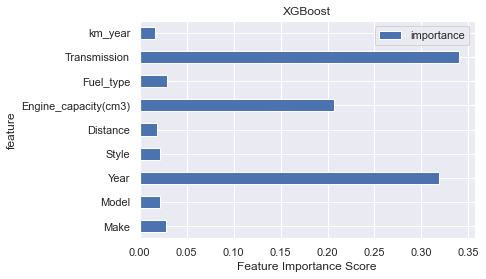

In [50]:
import xgboost as xg

scaler  = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)

features = X.columns

model = xg.XGBRegressor(random_state = 42)
model.fit(X_train,y_train)

print(model.score(X_test,y_test), model.score(X_train,y_train))

feat_imp = pd.DataFrame({'importance':model.feature_importances_}) 

feat_imp['feature'] = features

feat_imp = feat_imp.set_index('feature', drop=True)

feat_imp.plot.barh(title="XGBoost")

plt.xlabel('Feature Importance Score')

plt.show()

### Вопрос: 
<b>Назовите три самых важных фактора для установки цены? 
   

### Линейные методы регрессии

In [371]:
y_ohe = df_ohe["Price(euro)"]
X_ohe = df_ohe.drop(["Price(euro)"], axis = 1)
X_train, X_test, y_train, y_test = train_test_split(X_ohe, y_ohe, test_size=0.3, random_state=42)
pd.DataFrame(X_train).tail()

,Year,Distance,Engine_capacity(cm3),Transmission,km_year,Make_Acura,Make_Alfa Romeo,Make_Alta marca,Make_Audi,Make_BMW,...,Style_Roadster,Style_SUV,Style_Sedan,Style_Universal,Fuel_type_Diesel,Fuel_type_Electric,Fuel_type_Hybrid,Fuel_type_Metan/Propan,Fuel_type_Petrol,Fuel_type_Plug-in Hybrid
29802,2003,240000.0,1896.0,1,12631.578947,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
5390,2008,233000.0,2500.0,0,16642.857143,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
860,2006,286223.0,1800.0,0,17888.937500,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
15795,2006,291000.0,2000.0,0,18187.500000,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
23654,1983,290000.0,200.0,0,7435.897436,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0


In [372]:
from sklearn import linear_model
reg = linear_model.Ridge(alpha=.2, random_state=42)
reg.fit(X_train, y_train)

train_predictions = reg.predict(X_train)
train_score = reg.score(X_train,y_train)

test_predictions = reg.predict(X_test)
test_score = reg.score(X_test,y_test)

print(test_score,train_score)

0.6291802970114533 0.6376190894056215


In [373]:
from sklearn import linear_model
reg = linear_model.Lasso(alpha=.1, normalize=False, random_state=42) 
reg.fit(X_train, y_train)

train_predictions = reg.predict(X_train)
train_score = reg.score(X_train,y_train)

test_predictions = reg.predict(X_test)
test_score = reg.score(X_test,y_test)

print(test_score,train_score)

0.6291256861797634 0.6376061807406161


C:\Users\Администратор\AppData\Roaming\Python\Python37\site-packages\sklearn\linear_model\_coordinate_descent.py:532: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 340982755290.54535, tolerance: 197303252.32483813



### Вопрос: 
<b>Назовите самый высоко-точный регрессор? 
    

## Classification

first class: 14679 zero class: 17395


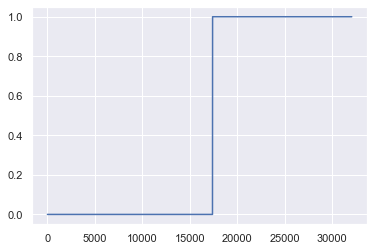

In [374]:
X = df_se.drop(["Transmission"],axis = 1)
y = df_se["Transmission"].values 
plt.plot(np.sort(y.copy()))
print('first class:', np.count_nonzero(y), 'zero class:', y.size - np.count_nonzero(y))

In [55]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
pd.DataFrame(X_train).tail()

,Make,Model,Year,Style,Distance,Engine_capacity(cm3),Fuel_type,Price(euro),km_year
29802,53,88,2003,10,240000.0,1896.0,0,4800.0,12631.578947
5390,21,101,2008,6,233000.0,2500.0,0,7899.0,16642.857143
860,32,31,2006,10,286223.0,1800.0,3,5999.0,17888.937500
15795,44,101,2006,6,291000.0,2000.0,3,4850.0,18187.500000
23654,32,101,1983,10,290000.0,200.0,4,1000.0,7435.897436


In [56]:
scaler  = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test) 
pd.DataFrame(X_train).tail()

,0,1,2,3,4,5,6,7,8
22446,0.963636,0.661654,0.64,0.909091,0.479896,0.353333,0.0,0.046092,0.251134
22447,0.381818,0.759398,0.74,0.545455,0.465893,0.479167,0.0,0.077144,0.331520
22448,0.581818,0.233083,0.70,0.909091,0.572360,0.333333,0.6,0.058106,0.356492
22449,0.800000,0.759398,0.70,0.545455,0.581916,0.375000,0.6,0.046593,0.362475
22450,0.581818,0.759398,0.24,0.909091,0.579916,0.000000,0.8,0.008016,0.147012


In [57]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
rf.fit(X_train, y_train)

train_predictions = rf.predict(X_train)
train_score = rf.score(X_train,y_train)

test_predictions = rf.predict(X_test)
test_score = rf.score(X_test,y_test)

print(test_score,train_score)


0.8665696768159618 0.8914079551022226


In [58]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

y_test_pred = rf.predict(X_test)
print('Accuracy score :', accuracy_score(y_test, y_test_pred),'\n\n\n')
print(classification_report(y_test, y_test_pred))

Accuracy score : 0.8665696768159618 



              precision    recall  f1-score   support

           0       0.85      0.92      0.88      5253
           1       0.89      0.80      0.85      4370

    accuracy                           0.87      9623
   macro avg       0.87      0.86      0.86      9623
weighted avg       0.87      0.87      0.87      9623



In [59]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(max_iter = 1e3,C=0.1,random_state=42)
clf.fit(X_train, y_train)

train_predictions = clf.predict(X_train)
train_score = clf.score(X_train,y_train)

test_predictions = clf.predict(X_test)
test_score = clf.score(X_test,y_test)

print(test_score,train_score)
print(classification_report(y_test, test_predictions))

0.8236516678790398 0.8119014743218564
              precision    recall  f1-score   support

           0       0.81      0.88      0.85      5253
           1       0.84      0.75      0.79      4370

    accuracy                           0.82      9623
   macro avg       0.83      0.82      0.82      9623
weighted avg       0.83      0.82      0.82      9623



In [60]:
from sklearn.model_selection import GridSearchCV

rf     = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
params ={'max_depth':[5,10,20,50,100,1e3]}

grid   = GridSearchCV(
             estimator=rf, 
             param_grid=params, 
             scoring = 'accuracy',
             n_jobs = 10, 
             cv = 3 
            )

grid.fit(X_train,y_train)

GridSearchCV(cv=3,
             estimator=RandomForestClassifier(max_depth=10, random_state=42),
             n_jobs=10, param_grid={'max_depth': [5, 10, 20, 50, 100, 1000.0]},
             scoring='accuracy')

In [61]:
from sklearn.metrics import accuracy_score

y_pred_test = grid.predict(X_test)
y_pred_train = grid.predict(X_train)
print('Best parameter: ',grid.best_params_)  
print('Best accuracy: ', accuracy_score(y_test,y_pred_test), accuracy_score(y_train,y_pred_train))
print(classification_report(y_test, test_predictions))

Best parameter:  {'max_depth': 20}
Best accuracy:  0.878624129689286 0.9986637566255401
              precision    recall  f1-score   support

           0       0.81      0.88      0.85      5253
           1       0.84      0.75      0.79      4370

    accuracy                           0.82      9623
   macro avg       0.83      0.82      0.82      9623
weighted avg       0.83      0.82      0.82      9623



[17:27:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\ProgramData\Anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



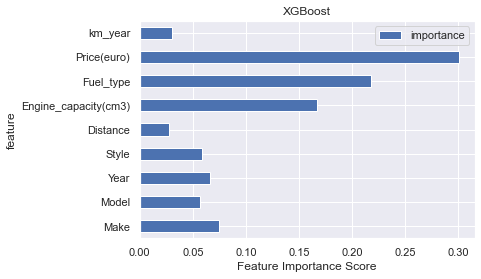

In [62]:
import xgboost as xg

scaler  = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)

features = X.columns

model = xg.XGBClassifier(random_state = 42)
model.fit(X_train,y_train)



feat_imp = pd.DataFrame({'importance':model.feature_importances_}) 

feat_imp['feature'] = features

feat_imp = feat_imp.set_index('feature', drop=True)

feat_imp.plot.barh(title="XGBoost")

plt.xlabel('Feature Importance Score')

plt.show()

### Вопрос: 
<b>Назовите наилучший показатель по глубине ? 
    

### Вопрос: 
<b>Назовите наименее переобученный классификатор ? 
    

### Вопрос: 
<b>Назовите фактор, который неименее всего виляет на определение трансмиссии? 
    